<a href="https://colab.research.google.com/github/AdrianaCaetano/Data_Project_Club/blob/main/1_Manufacturing/manufacturing_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Project Club 

This project was developed as part of the **Data Project Club** to help data professionals showcase their skills . Using real datasets, we will analyze data to answer business questions. 





## Manufacturing Oil Rig 

The first project is for an Industrial Manufacturing Company, which ficticious name is EnergyMobil.

Your role is to provide value to the company using the provided data to run the manufacturing plant more efficiently. 

### Data Analyst role
Create a manufacturing monitoring dasboard tht allows management to understand the manufacturing process in more detail.

### Data Scientist role
Create a fault detection an classification model to discover when and what caused the process to degrade.




### Dataset
The data comes from a real hydraulic rig system. This hydraulic rig is used to drill oil out of the ground. 

It has four main controls:
- the cooler setting
- the valve setting
- the pump seetting
- the accumulator setting

The rig has sensors in differenct areas measuring the pressure, volumetric flows, and temperatures. 


The original dataset is from [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/machine-learning-databases/00447/). A combined dataset is provided at [AveryData Github page](https://github.com/AveryData/hp-pred), [HourlyData.csv](https://github.com/AveryData/hp-pred/blob/main/HourlyData.csv) file. 


This is the summary from the UCI database files `description.txt` and `documentation.txt`:

**Relevant Information:**

The data set was experimentally obtained with a hydraulic test rig. This test rig consists of a primary working and a secondary cooling-filtration circuit which are connected via the oil tank. The system cyclically repeats constant load cycles (duration 60 seconds) and measures process values such as pressures, volume flows and temperatures while the condition of four hydraulic components (cooler, valve, pump and accumulator) is quantitatively varied.

**Number of Instances:** 2205

**Number of Attributes:** 43680 (8x60 (1 Hz) + 2x600 (10 Hz) + 7x6000 (100 Hz))

**Attribute Information:**

- Attributes are sensor data (all numeric and continuous) from measurements taken at the same point in time, respectively, of a hydraulic test rig's working cycle.
- The sensors were read with different sampling rates, leading to different numbers of attributes per sensor despite they were all exposed to the same working cycle.
   
   1. Pressure sensors (PS1-6): 100 Hz, 6000 attributes per sensor (6 sensors)
   2. Motor power sensor (EPS1): 100 Hz, 6000 attributes per sensor (1 sensor)
   3. Volume flow sensors (FS1/2): 10 Hz, 600 attributes per sensor (2 sensors)
   4. Temperature sensors (TS1-4): 1 Hz, 60 attributes per sensor (4 sensors)
   5. Vibration sensor (VS1): 1 Hz, 60 attributes per sensor (1 sensor)
   6. Efficiency factor (SE): 1 Hz, 60 attributes per sensor (1 sensor)
   7. Virtual cooling efficiency sensor (CE): 1 Hz, 60 attributes per sensor (1 sensor)
   8. Virtual cooling power sensor (CP): 1 Hz, 60 attributes per sensor (1 sensor)


**Missing Attribute Values:** None

**Attribute Information:** 

The data set contains raw process sensor data with the rows representing the cycles and the columns the data points within a cycle. The sensors involved are:

Sensor	|	Physical quantity	|	Unit	|	Sampling rate
--------|-----------------------|-----------|-----------------
PS1	|	Pressure	|		bar	|	100 Hz
PS2	|	Pressure	|		bar	|	100 Hz
PS3	|	Pressure	|		bar	|	100 Hz
PS4	|	Pressure	|		bar	|	100 Hz
PS5	|	Pressure	|		bar	|	100 Hz
PS6	|	Pressure	|		bar	|	100 Hz
EPS1	|	Motor power		|	W	|	100 Hz
FS1	|	Volume flow		|	l/min	|	10 Hz
FS2	|	Volume flow		|	l/min	|	10 Hz
TS1	|	Temperature		|	∞C	|	1 Hz
TS2	|	Temperature		|	∞C	|	1 Hz
TS3	|	Temperature		|	∞C	|	1 Hz
TS4	|	Temperature		|	∞C	|	1 Hz
VS1	|	Vibration		|	mm/s	|	1 Hz
CE	|	Cooling efficiency (virtual)|	%	|	1 Hz
CP	|	Cooling power (virtual)	|	kW	|	1 Hz
SE	|	Efficiency factor	|	%	|	1 Hz

![Oil Rig System Diagram](https://github.com/AdrianaCaetano/Data_Project_Club/blob/main/1_Manufacturing/images/oil_rig_diagram.png)

Source: Alenany, A., Helmi, A. M., & Nasef, B. M. (2021). Comprehensive Analysis for Sensor-based Hydraulic System Condition Monitoring. International Journal of Advanced Computer Science and Applications, 12(6), 153-162.

## Import data

In [1]:
import pandas as pd

# import file
raw_file_url = 'https://raw.githubusercontent.com/AveryData/hp-pred/main/HourlyData.csv'
df = pd.read_csv(raw_file_url, index_col=[0])
df.sample(5)

,Time,Cooling efficiency,Cooling power,Motor power W,Volume flow l/min 1,Volume flow l/min 2,Pressure bar 1,Pressure bar 2,Pressure bar 3,Pressure bar 4,Pressure bar 5,Pressure bar 6,Efficiency factor,Temperature 1,Temperature 2,Temperature 3,Temperature 4,Vibration mm/s,Date
109860,109860,46.188,2.091,2423.8,7.948,10.159,150.63,124.98,2.219,10.065,9.833,9.733,64.407,36.410,41.910,39.168,31.520,0.553,2018-07-11 07:00:00
126540,126540,46.955,2.163,2434.0,8.073,10.156,150.82,125.02,2.227,10.099,9.887,9.764,64.444,35.828,41.441,38.695,30.805,0.545,2018-07-22 21:00:00
80760,80760,27.674,1.755,2355.6,8.097,9.784,148.55,123.27,1.992,0.000,9.167,9.076,65.276,44.184,49.164,46.242,39.582,0.626,2018-06-21 02:00:00
124320,124320,47.139,2.159,2411.8,8.093,10.154,151.46,125.40,2.336,10.070,9.841,9.736,68.065,36.133,41.750,38.855,30.957,0.552,2018-07-21 08:00:00
36000,36000,19.072,1.481,2235.8,8.706,8.929,146.07,120.25,1.977,0.000,8.425,8.375,69.169,57.090,61.437,58.449,52.312,0.605,2018-05-21 00:00:00


In [2]:
df.shape

(2205, 19)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2205 entries, 0 to 132240
Data columns (total 19 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Time                 2205 non-null   int64  
 1   Cooling efficiency   2205 non-null   float64
 2   Cooling power        2205 non-null   float64
 3   Motor power W        2205 non-null   float64
 4   Volume flow l/min 1  2205 non-null   float64
 5   Volume flow l/min 2  2205 non-null   float64
 6   Pressure bar 1       2205 non-null   float64
 7   Pressure bar 2       2205 non-null   float64
 8   Pressure bar 3       2205 non-null   float64
 9   Pressure bar 4       2205 non-null   float64
 10  Pressure bar 5       2205 non-null   float64
 11  Pressure bar 6       2205 non-null   float64
 12  Efficiency factor    2205 non-null   float64
 13  Temperature 1        2205 non-null   float64
 14  Temperature  2       2205 non-null   float64
 15  Temperature  3       2205 non-null  

In [4]:
type(df['Date'][0])

str

The dataset has 2205 rows and 19 columns, with no missing values. Most of the values are measurements expressed in numbers, int or float. Only date is an object, but it is a str. Let's convert it to datetime. 

In [5]:
# convert column Date to Datetime object
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d %H:%M:%S.%f')

type(df['Date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [6]:
pd.Timedelta(df['Date'].iloc[-1] - df['Date'][0])

Timedelta('91 days 20:00:00')

In [7]:
print(df['Date'][0], df['Date'].iloc[-1])

2018-04-26 00:00:00 2018-07-26 20:00:00


Our dataset covers 91 days and 20 hours of measurements, from April to July in 2018. 

In [8]:
# by Ihab 
df.describe() 

,Time,Cooling efficiency,Cooling power,Motor power W,Volume flow l/min 1,Volume flow l/min 2,Pressure bar 1,Pressure bar 2,Pressure bar 3,Pressure bar 4,Pressure bar 5,Pressure bar 6,Efficiency factor,Temperature 1,Temperature 2,Temperature 3,Temperature 4,Vibration mm/s
count,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000
mean,66120.000000,31.325613,1.808180,2341.493968,8.287100,9.651824,148.978467,123.362422,2.109728,2.585712,9.167484,9.083592,67.071473,45.511420,50.456266,47.635995,40.712106,0.603251
std,38200.379579,11.532175,0.272483,76.469325,0.480969,0.449138,3.684421,3.701729,0.192998,4.299882,0.576749,0.550135,4.645096,8.025131,7.445679,7.481373,8.108900,0.052399
min,0.000000,17.356000,1.083000,2227.800000,7.033000,8.816000,144.920000,119.610000,0.492000,0.000000,8.342000,8.304000,10.784000,35.398000,40.840000,38.176000,30.355000,0.519000
25%,33060.000000,20.165000,1.558000,2273.800000,7.961000,9.210000,147.060000,121.630000,2.000000,0.000000,8.559000,8.498000,65.751000,36.312000,41.914000,39.086000,31.254000,0.561000
50%,66120.000000,27.334000,1.736000,2333.800000,8.278000,9.691000,148.560000,123.040000,2.086000,0.000000,9.114000,9.029000,67.958000,44.863000,49.832000,47.012000,40.410000,0.601000
75%,99180.000000,46.651000,2.138000,2413.600000,8.610000,10.154000,150.980000,125.100000,2.250000,3.757000,9.850000,9.733000,68.990000,54.238000,58.707000,55.660000,49.340000,0.625000
max,132240.000000,48.136000,2.839000,2863.200000,11.754000,10.408000,188.800000,165.480000,2.555000,10.245000,10.010000,9.887000,70.480000,58.039000,62.094000,59.484000,53.043000,1.037000


From the above table,we know Maximum and minium values for each measurement. For example, minimum Cooling Efficiency is 17.36%, max is 48.14%, and mean is 31.32%.

In [17]:
# make date the index
df_i = df.set_index('Date')
df_i.sample(2)

,Time,Cooling efficiency,Cooling power,Motor power W,Volume flow l/min 1,Volume flow l/min 2,Pressure bar 1,Pressure bar 2,Pressure bar 3,Pressure bar 4,Pressure bar 5,Pressure bar 6,Efficiency factor,Temperature 1,Temperature 2,Temperature 3,Temperature 4,Vibration mm/s
Date,,,,,,,,,,,,,,,,,,
2018-06-04 04:00:00,56400,26.468,1.715,2317.6,8.855,9.631,148.75,122.85,2.086,0.000,9.018,8.946,69.244,46.406,51.379,48.441,41.840,0.607
2018-07-24 12:00:00,128880,46.686,2.137,2423.6,7.918,10.169,151.16,125.42,2.195,10.147,9.928,9.807,65.952,35.668,41.312,38.437,30.617,0.550


## Visualize Features

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

%matplotlib inline

In [10]:
col_names= list(df.columns) # to show column names so we can delete no required column if needed 
print(col_names)

['Time', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 1', 'Volume flow l/min 2', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Efficiency factor', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s', 'Date']


<ipython-input-10-71f46db33628>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr= df_heatmap.corr()         # to find correlation between measurments


<Axes: >

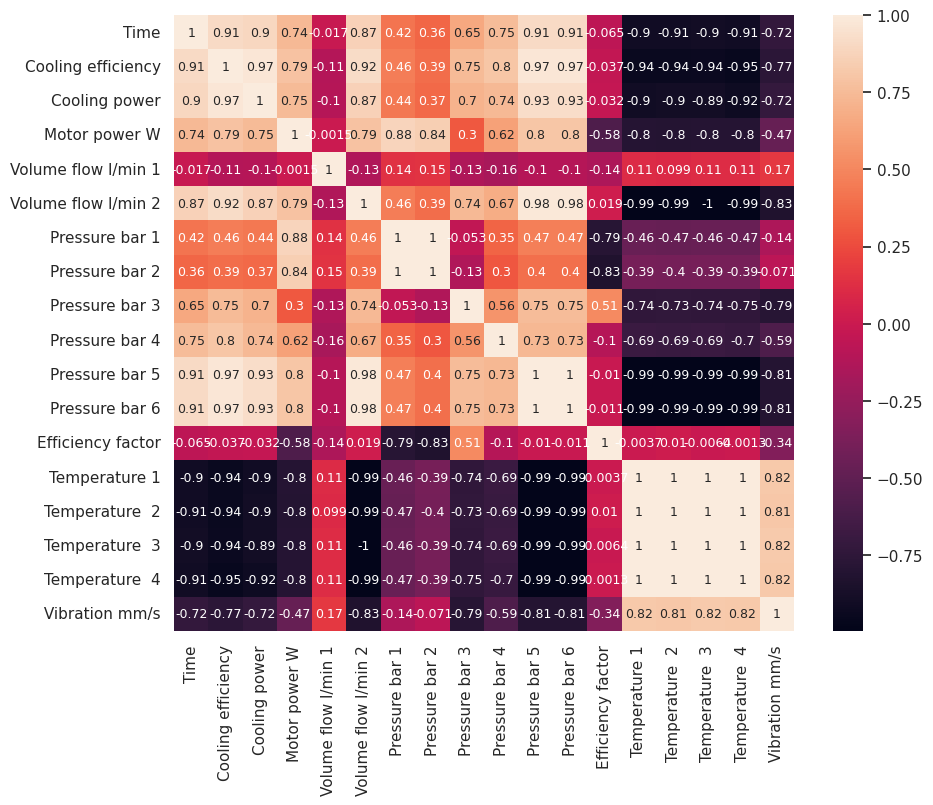

In [ ]:
#by Ihab 

df_heatmap= df[col_names]       # new data frame named df_HeatMap created without time and date
corr= df_heatmap.corr()         # to find correlation between measurments                                             
sns.set (rc = {'figure.figsize':(10, 8)})   # change the heatmap size 
sns.heatmap(corr,annot=True,annot_kws={'fontsize':9})   # seaborn HeatMap function


From above we can note that there is perfect positive correlation for :
- Temperature 1,2,3 and 4
- pressure bar 1 & 2
- Pressure bar 5 & 6 

also there is a perfect negative correlation between:
- Volume flow l/min 2 and temperature 3


<Axes: >

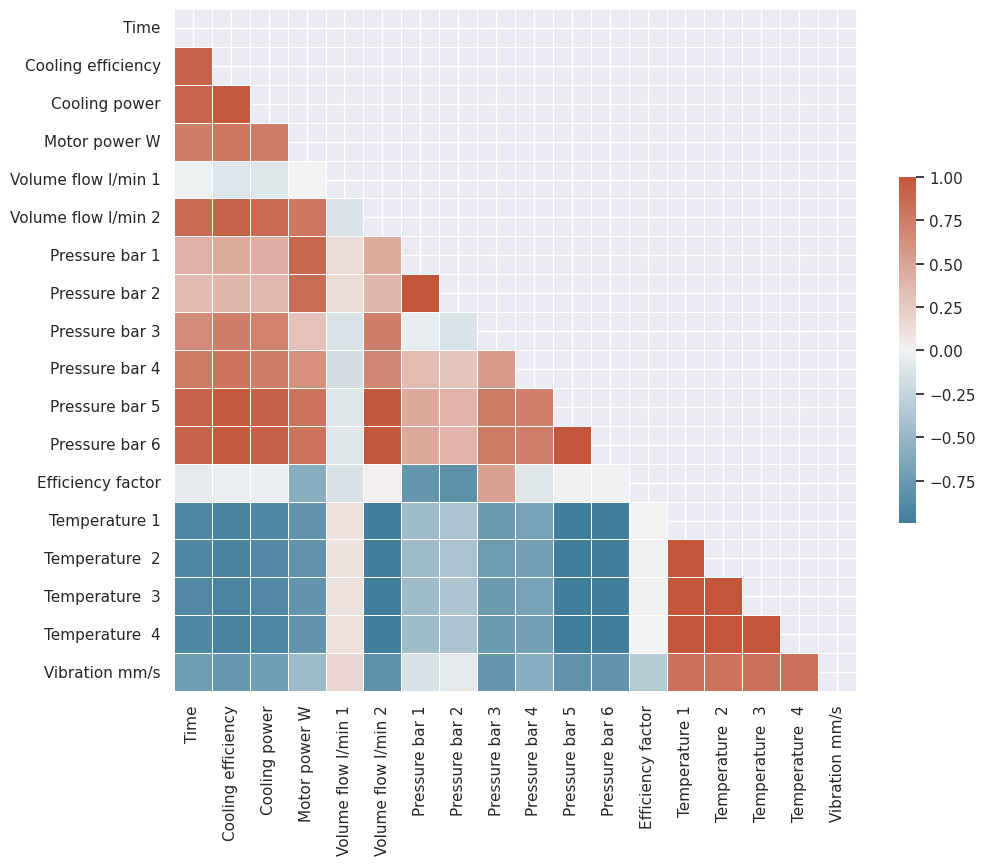

In [ ]:
mask = np.triu(np.ones_like(corr, dtype=bool))     # generate a mask for the upper triangle  
f, ax = plt.subplots(figsize=(11, 9)) # Set up the matplotlib figure
cmap = sns.diverging_palette(230, 20, as_cmap=True) # Generate a custom diverging colormap

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

- Volume flow 1 has a weak negative correlation with pressures 3,4,5,6 and volume flow 2 features, and a weak positive correlation with pressure 1,2, temperature, and vibration. 
- Efficiency has a weak correlation with temperature.




<Axes: >

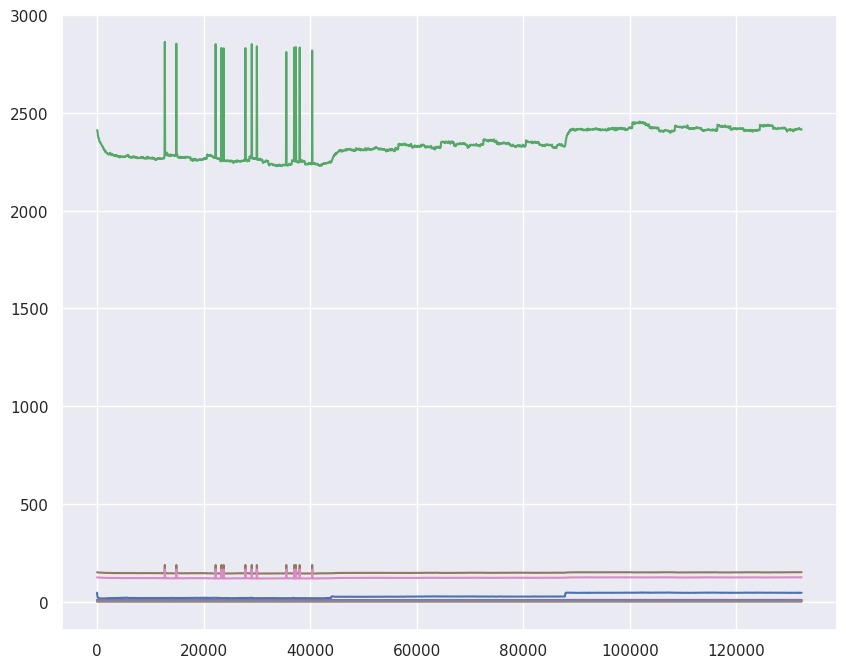

In [ ]:
# plot all features

df['Cooling efficiency'].plot() #[, , , , , , , ,  'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Efficiency factor', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s', 'Date']
df['Cooling power'].plot()
df['Motor power W'].plot()
df['Volume flow l/min 1'].plot()
df['Volume flow l/min 2'].plot()
df['Pressure bar 1'].plot()
df['Pressure bar 2'].plot()
df['Pressure bar 3'].plot()


<ipython-input-23-3025eb0ccfcf>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_df = df.corr()


[Text(0, 0, ' Vibration mm/s'),
 Text(1, 0, 'Cooling efficiency'),
 Text(2, 0, 'Cooling power'),
 Text(3, 0, 'Efficiency factor'),
 Text(4, 0, 'Motor power W'),
 Text(5, 0, 'Pressure bar 1'),
 Text(6, 0, 'Pressure bar 2'),
 Text(7, 0, 'Pressure bar 3'),
 Text(8, 0, 'Pressure bar 4'),
 Text(9, 0, 'Pressure bar 5'),
 Text(10, 0, 'Pressure bar 6'),
 Text(11, 0, 'Temperature  2'),
 Text(12, 0, 'Temperature  3'),
 Text(13, 0, 'Temperature  4'),
 Text(14, 0, 'Temperature 1'),
 Text(15, 0, 'Time'),
 Text(16, 0, 'Volume flow l/min 1'),
 Text(17, 0, 'Volume flow l/min 2')]

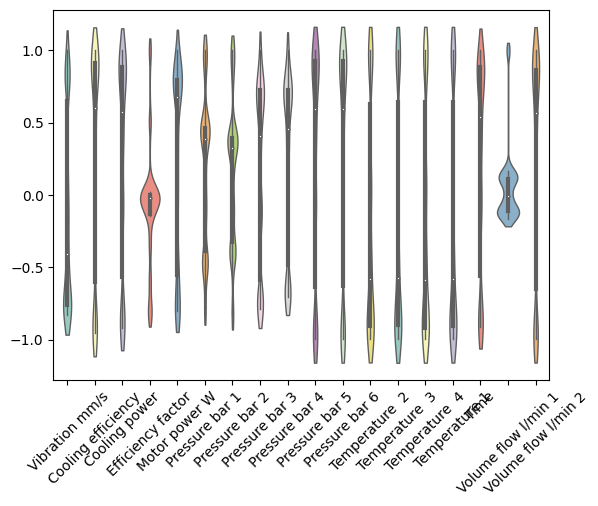

In [ ]:
# Create features violin plot

# Compute the correlation matrix
corr_df = df.corr()
corr_df = corr_df.sort_index().T

# Draw a violinplot with a narrower bandwidth than the default
ax = sns.violinplot(data=corr_df, palette="Set3", bw=.2, cut=1, linewidth=1)

# Finalize the figure
ax.set_xticklabels(corr_df.columns, rotation= 45)


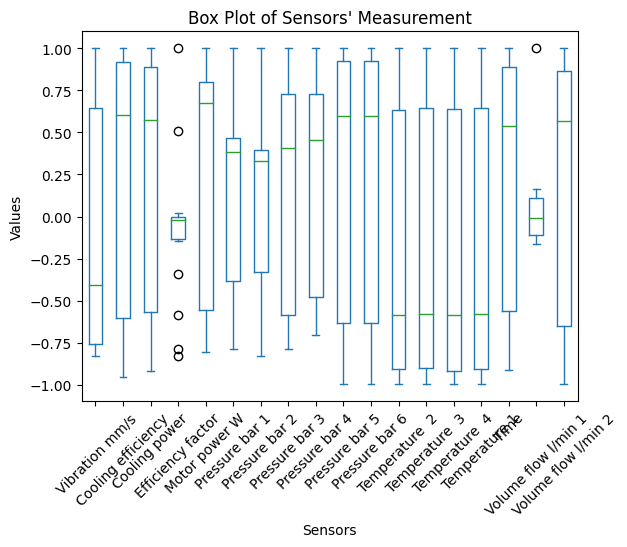

In [ ]:
# create a box plot of a sensor measurement
corr_df.plot(kind='box')

# add a title and axis labels to the plot
plt.title("Box Plot of Sensors' Measurement")
plt.xlabel('Sensors')
plt.ylabel('Values')
plt.xticks(rotation=45)

# show the plot
plt.show()

In [ ]:
col_names

['Time',
 'Cooling efficiency',
 'Cooling power',
 'Motor power W',
 'Volume flow l/min 1',
 'Volume flow l/min 2',
 'Pressure bar 1',
 'Pressure bar 2',
 'Pressure bar 3',
 'Pressure bar 4',
 'Pressure bar 5',
 'Pressure bar 6',
 'Efficiency factor',
 'Temperature 1',
 'Temperature  2',
 'Temperature  3',
 'Temperature  4',
 ' Vibration mm/s',
 'Date']

(<Figure size 1200x2400 with 18 Axes>,
 array([[<Axes: title={'center': 'Time'}>,
         <Axes: title={'center': 'Cooling efficiency'}>,
         <Axes: title={'center': 'Cooling power'}>],
        [<Axes: title={'center': 'Motor power W'}>,
         <Axes: title={'center': 'Volume flow l/min 1'}>,
         <Axes: title={'center': 'Volume flow l/min 2'}>],
        [<Axes: title={'center': 'Pressure bar 1'}>,
         <Axes: title={'center': 'Pressure bar 2'}>,
         <Axes: title={'center': 'Pressure bar 3'}>],
        [<Axes: title={'center': 'Pressure bar 4'}>,
         <Axes: title={'center': 'Pressure bar 5'}>,
         <Axes: title={'center': 'Pressure bar 6'}>],
        [<Axes: title={'center': 'Efficiency factor'}>,
         <Axes: title={'center': 'Temperature 1'}>,
         <Axes: title={'center': 'Temperature  2'}>],
        [<Axes: title={'center': 'Temperature  3'}>,
         <Axes: title={'center': 'Temperature  4'}>,
         <Axes: title={'center': ' Vibration mm/s'}

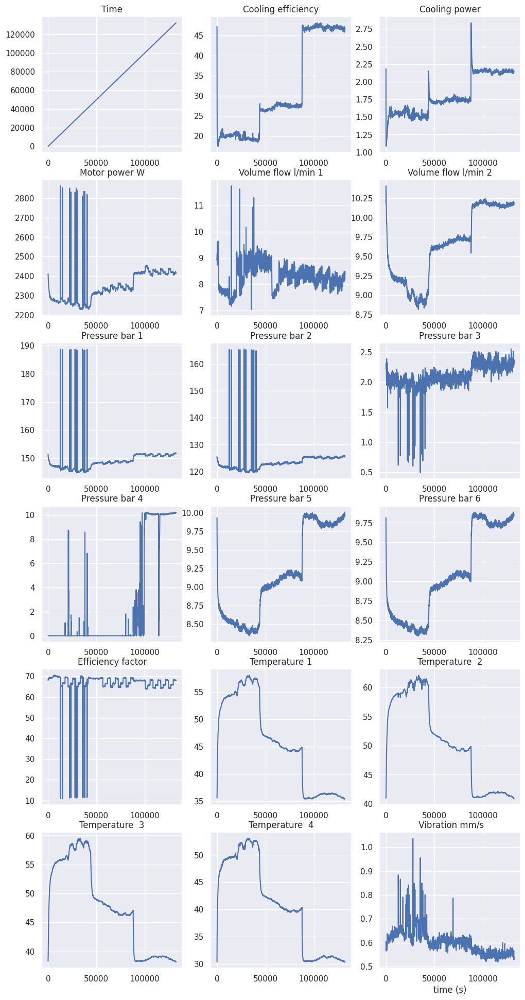

In [ ]:
# Create multiple small plots for each feature

import itertools

# define how many elements within the figure with nrows and ncols
plot_objects = plt.subplots(nrows=6, ncols=3, figsize=(12, 24))

fig, ((ax1, ax2, ax3), 
      (ax4, ax5, ax6), 
      (ax7, ax8, ax9),
      (ax10, ax11, ax12), 
      (ax13, ax14, ax15), 
      (ax16,ax17, ax18)
      ) = plot_objects

axis_list = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15, ax16,ax17, ax18]

for ax, col in zip(axis_list, col_names):
    ax.plot(df[col])
    ax.set_title(col)
    
plt.xlabel('time (s)')

plot_objects

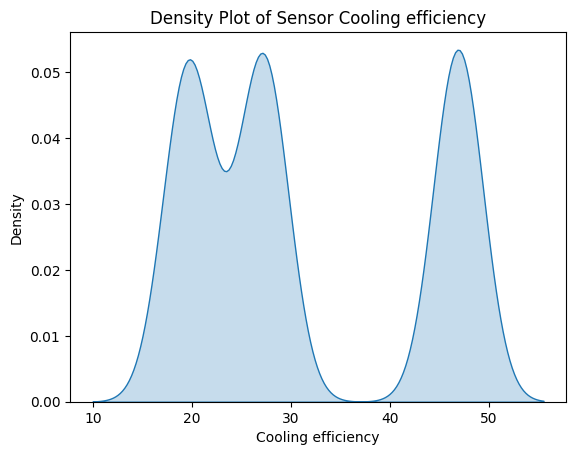

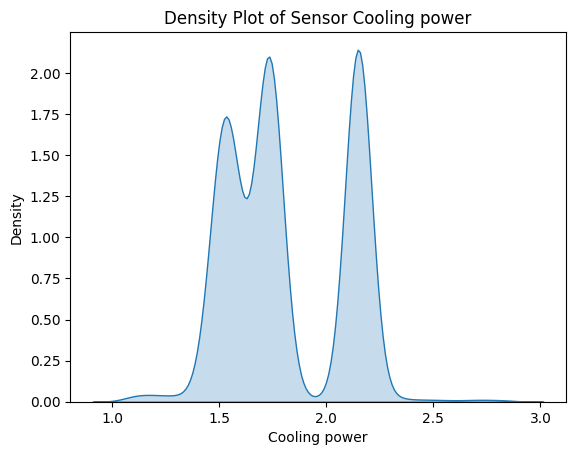

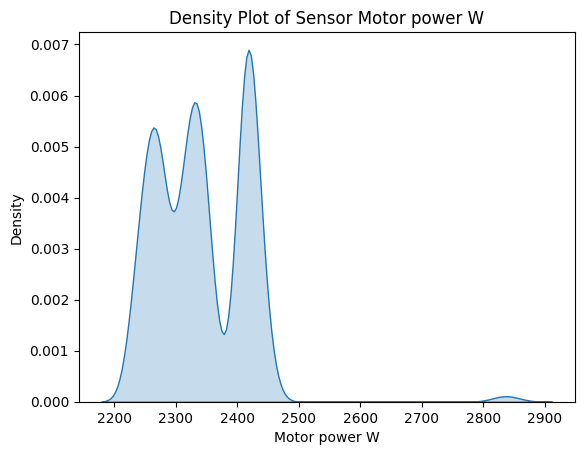

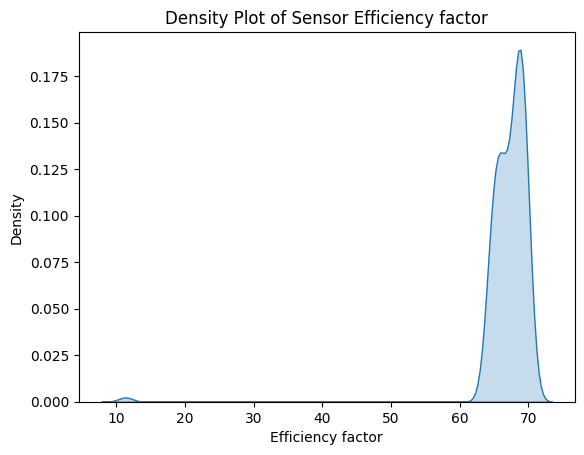

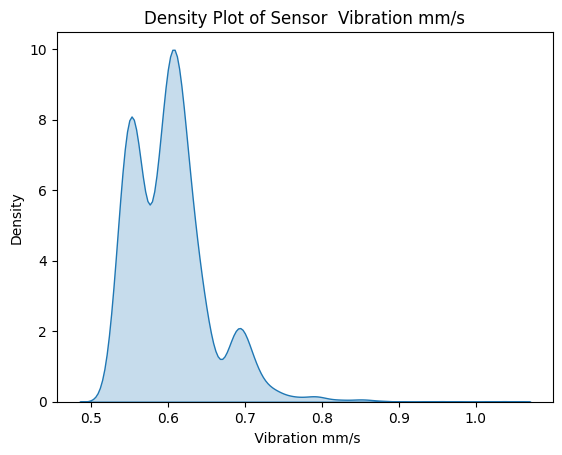

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

# A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset


# define a list of unique sensor names
col_sensors = [
 'Cooling efficiency',
 'Cooling power',
 'Motor power W',
 'Efficiency factor',
 ' Vibration mm/s',]

for col in col_sensors:
    # create a density plot of a sensor measurement
    sns.kdeplot(df_i[col], fill=True)

    # add a title and axis labels to the plot
    plt.title('Density Plot of Sensor ' + col)
    plt.xlabel(col)
    plt.ylabel('Density')

    # show the plot
    plt.show()

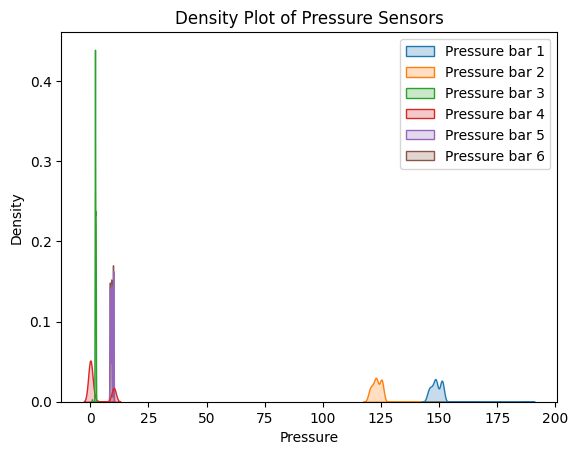

In [ ]:
df_pressure = df_i[['Pressure bar 1',
 'Pressure bar 2',
 'Pressure bar 3',
 'Pressure bar 4',
 'Pressure bar 5',
 'Pressure bar 6']]

sns.kdeplot(data= df_pressure, fill=True)
# add a title and axis labels to the plot
plt.title('Density Plot of Pressure Sensors')
plt.xlabel('Pressure')
plt.ylabel('Density')

# show the plot
plt.show()


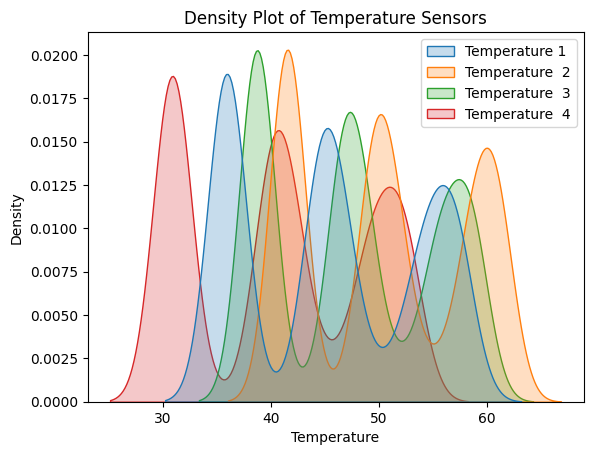

In [ ]:
df_temperature = df_i[[ 'Temperature 1',
 'Temperature  2',
 'Temperature  3',
 'Temperature  4']]

sns.kdeplot(data= df_pressure, fill=True)
# add a title and axis labels to the plot
plt.title('Density Plot of Temperature Sensors')
plt.xlabel('Temperature')
plt.ylabel('Density')

# show the plot
plt.show()

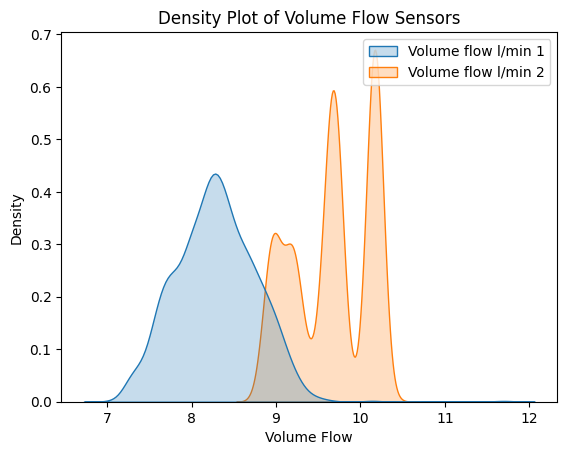

In [ ]:
df_flow = df_i[[ 'Volume flow l/min 1','Volume flow l/min 2',]]

sns.kdeplot(data= df_flow, fill=True)
# add a title and axis labels to the plot
plt.title('Density Plot of Volume Flow Sensors')
plt.xlabel('Volume Flow')
plt.ylabel('Density')

# show the plot
plt.show()

## Relationships

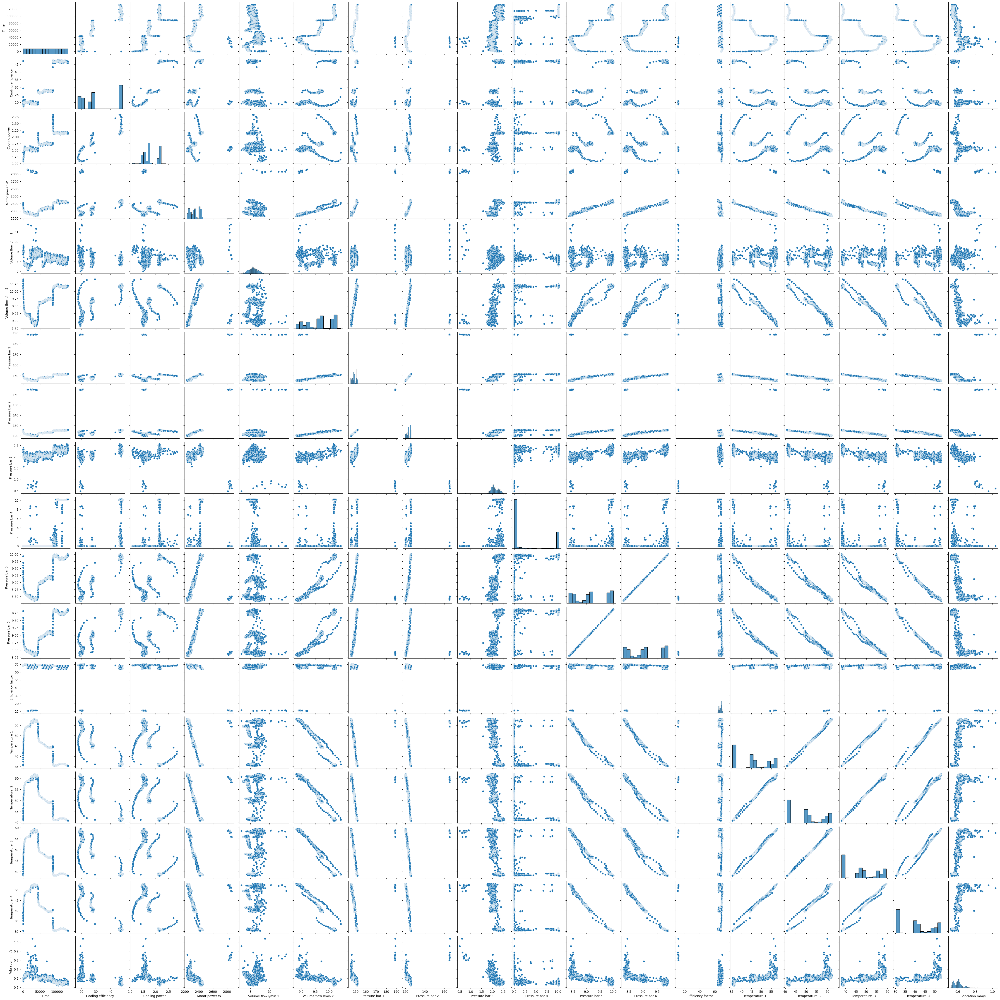

In [ ]:
# pairwise feature relationship

sns.pairplot(data = df_i)
plt.show ()

Since the dataset has too many features, it's not clear on the small plots what are the features' relationships 

In [11]:
# columns names without efficiency factor, time and date
col_names= ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 1',   
            'Volume flow l/min 2', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 3', 
            'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1',
            'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s']

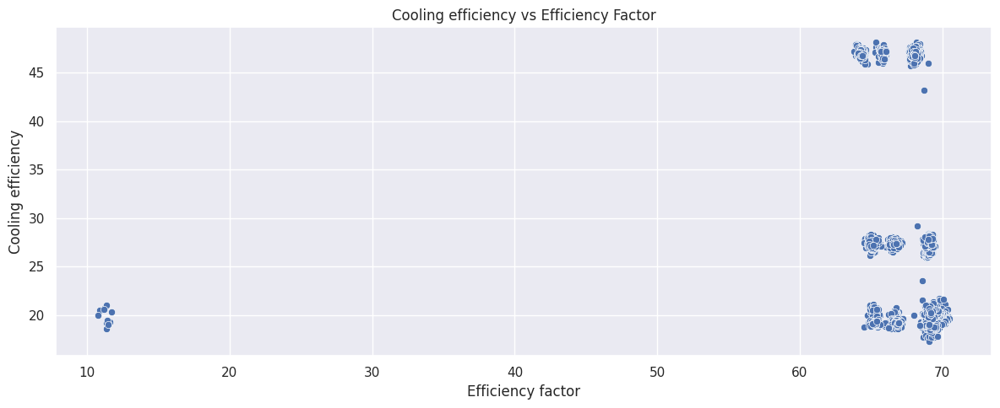

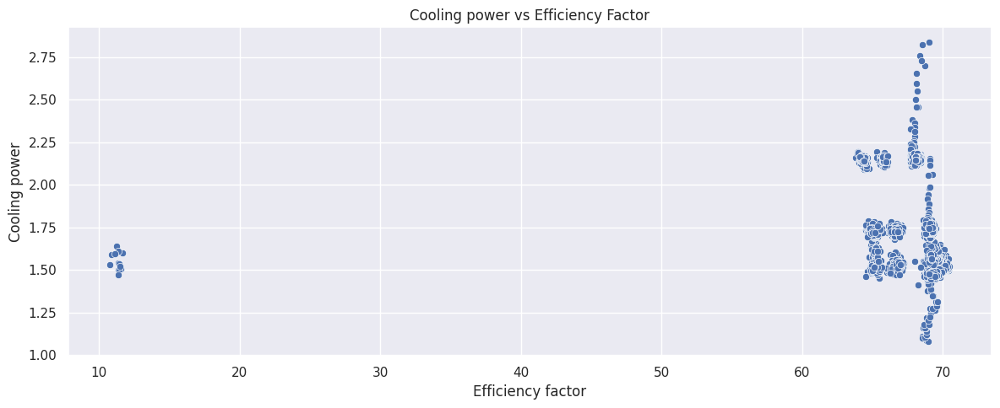

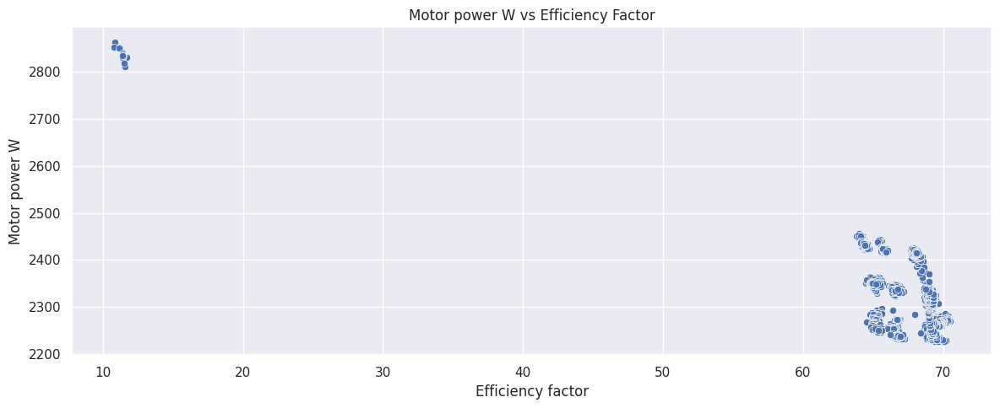

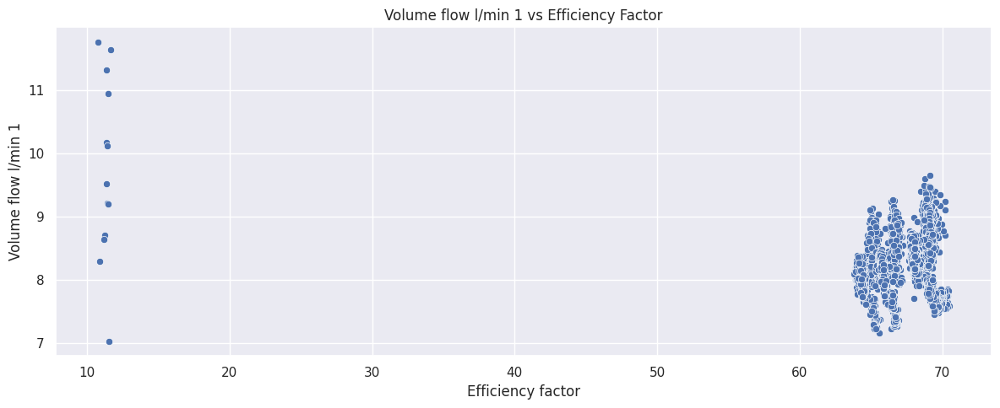

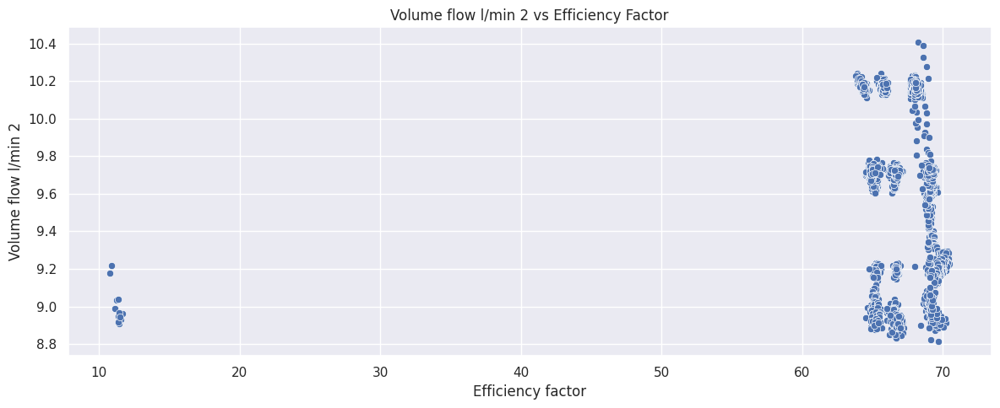

...

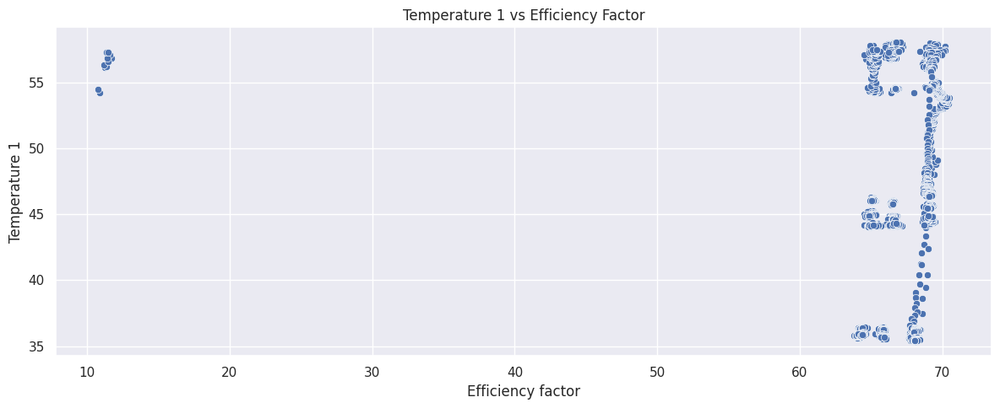

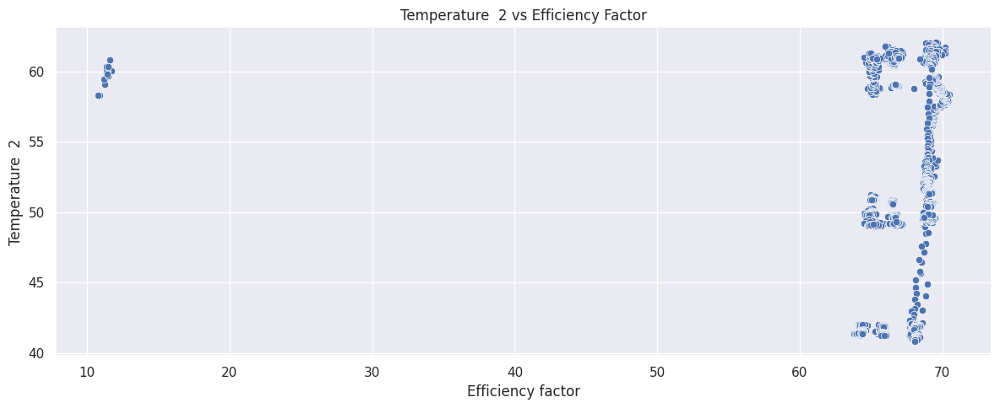

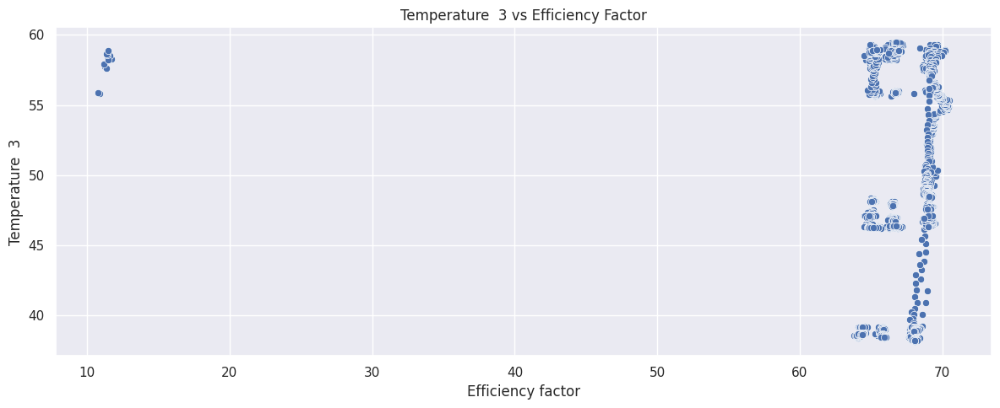

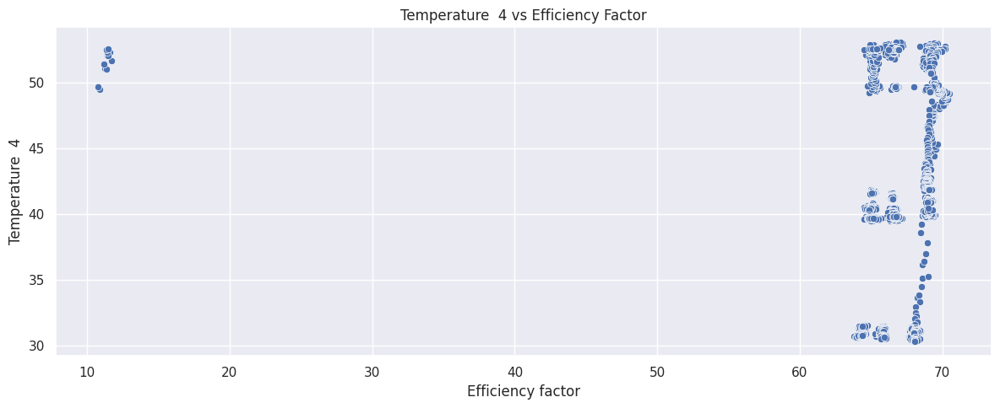

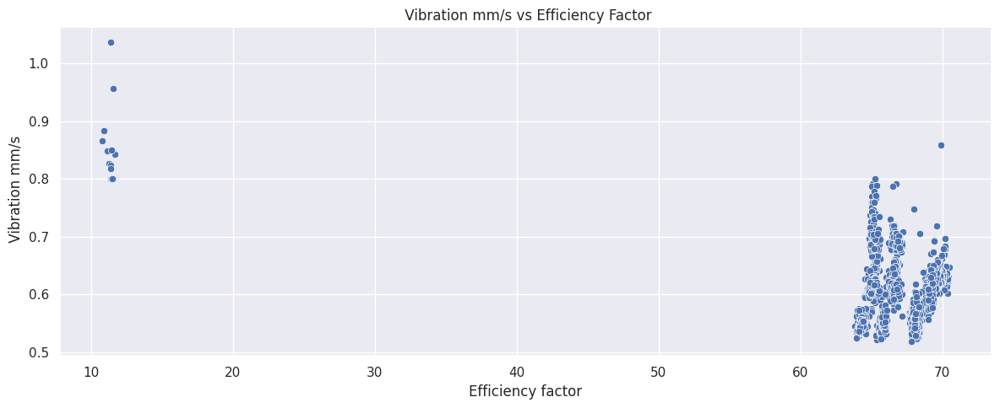

In [ ]:
# relationship between Efficiency factor and other features

for col in col_names:
    sns.scatterplot(data=df, x= 'Efficiency factor', y= col)
    plt.title(col + ' vs Efficiency Factor')
    plt.show()


Focusing only in Efficiency factor, when we plot the relationships it is clear that motor power, pressure bar 1, 2, and 3, an




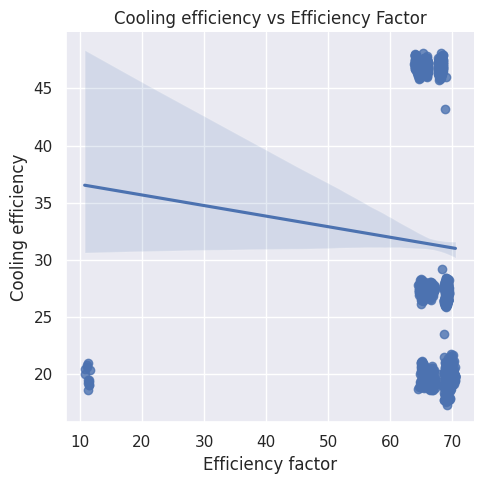

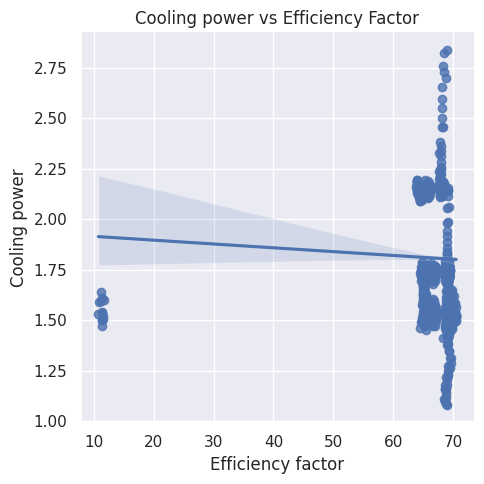

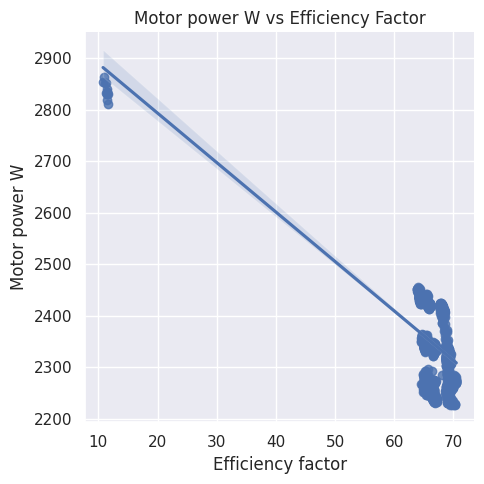

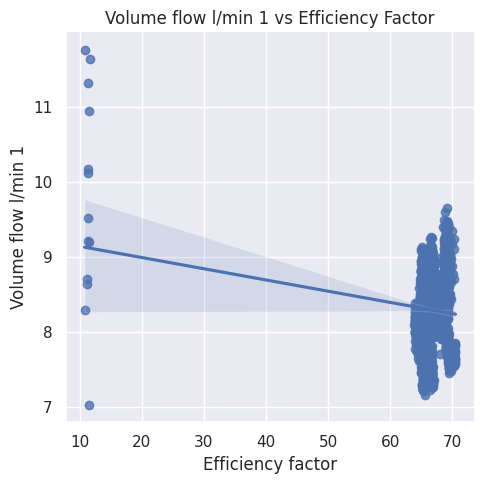

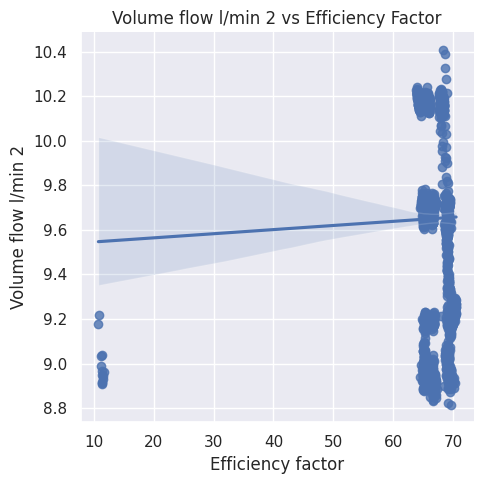

...

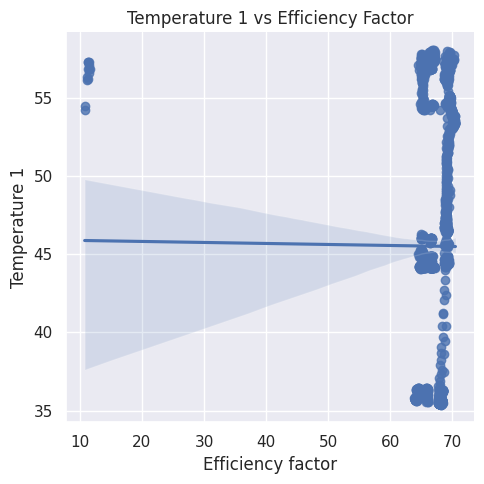

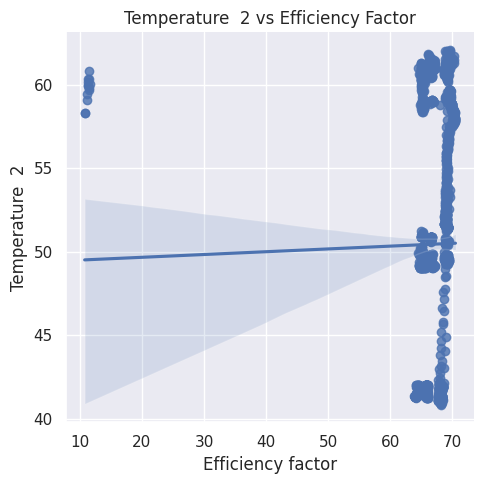

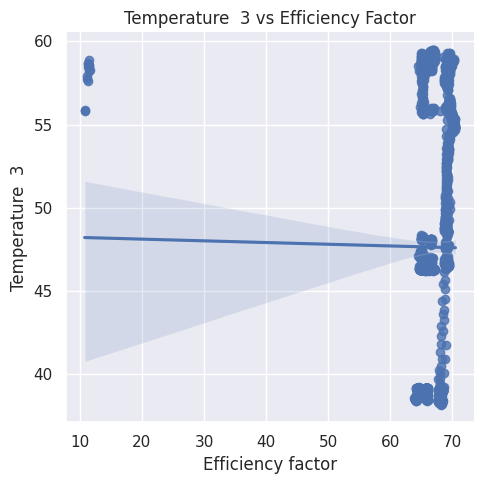

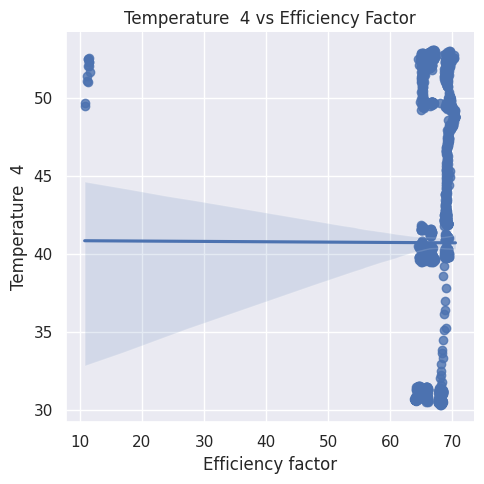

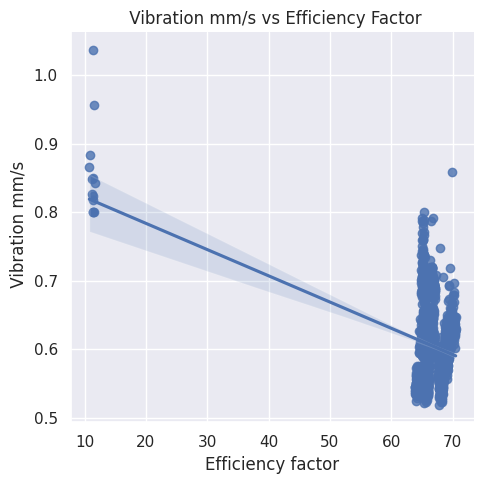

In [ ]:
# # interface to fit regression models across conditional subsets of a dataset

for col in col_names:
    sns.lmplot(data=df, x= 'Efficiency factor', y= col)
    plt.title(col + ' vs Efficiency Factor')

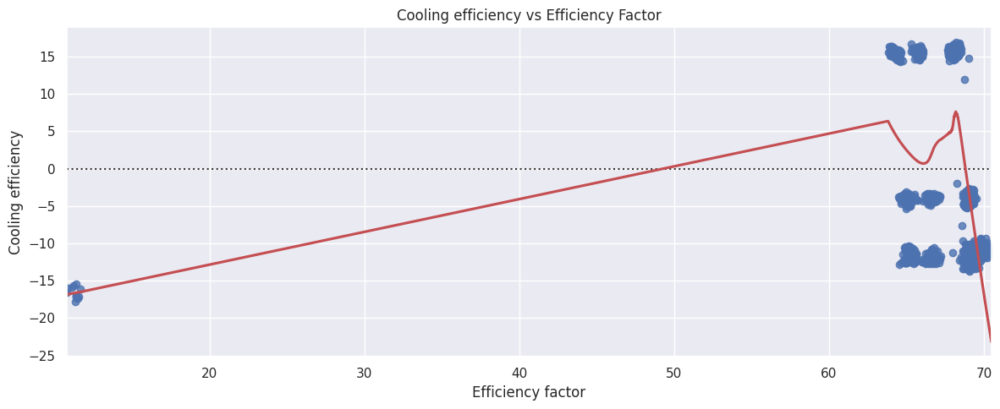

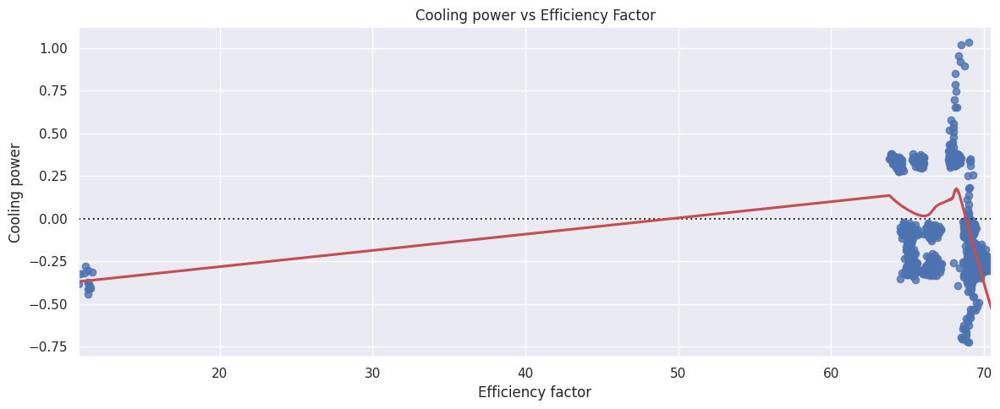

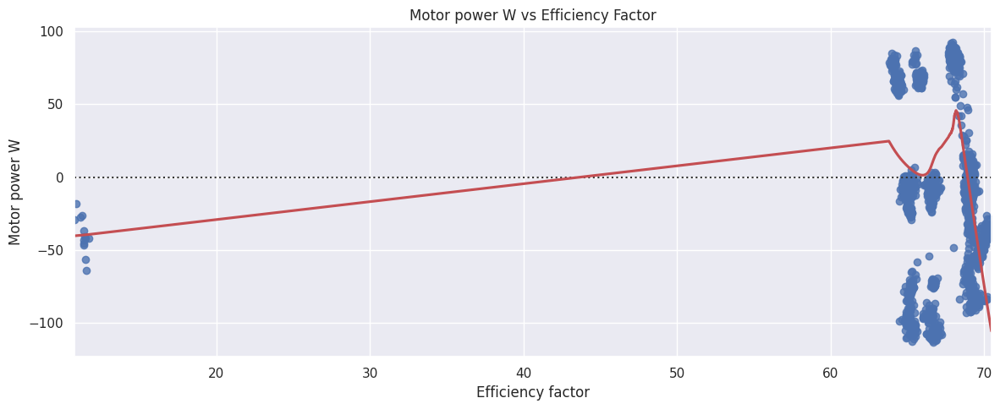

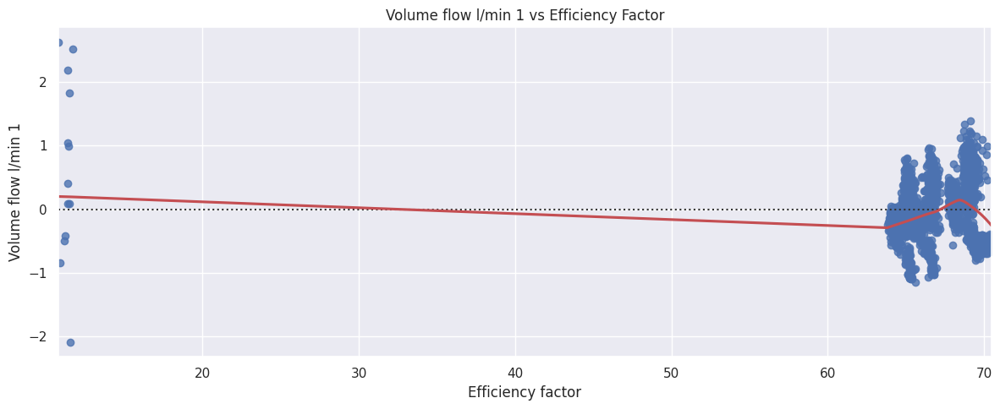

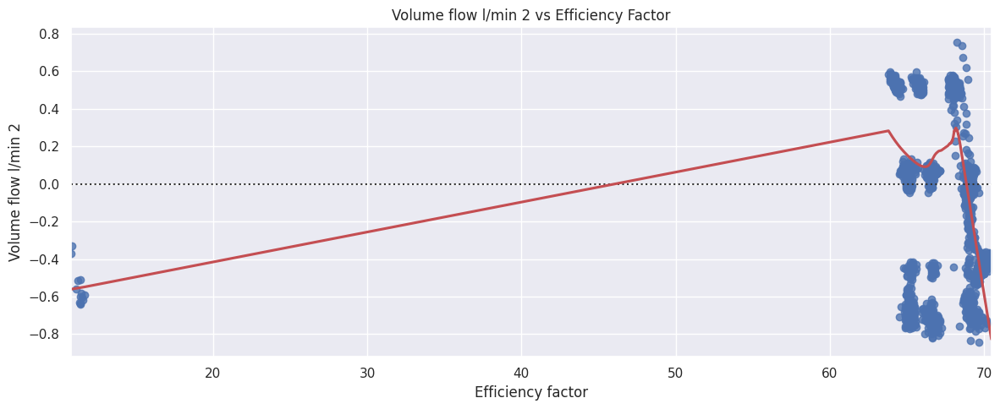

...

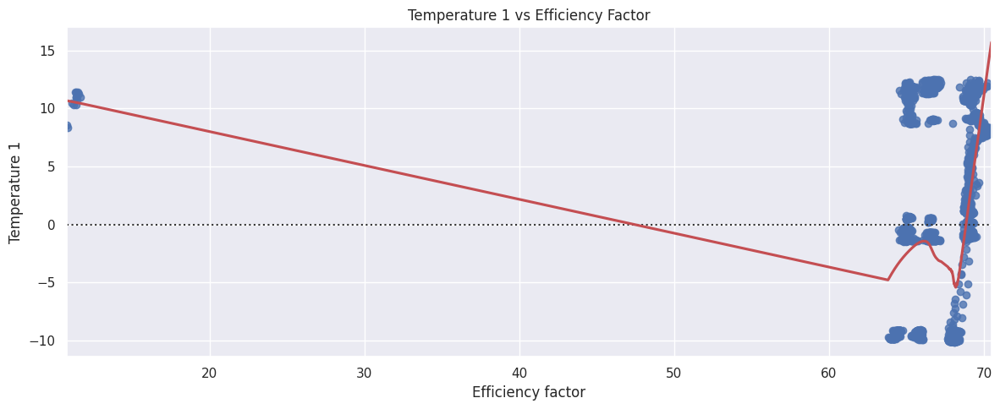

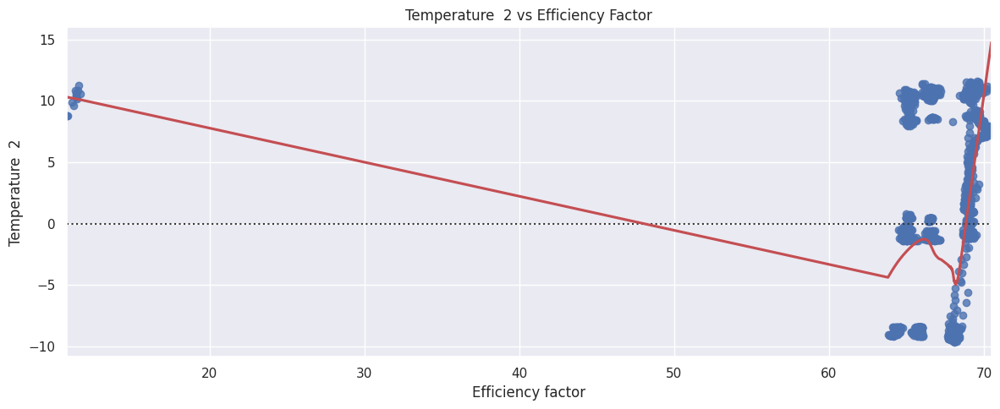

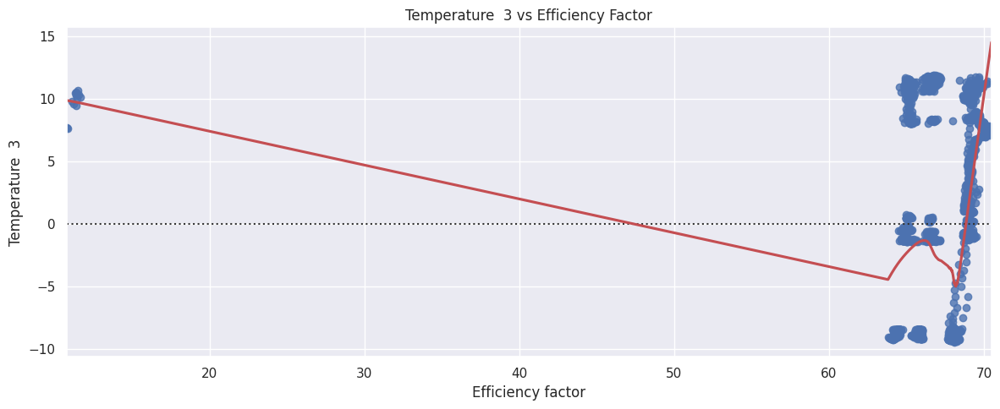

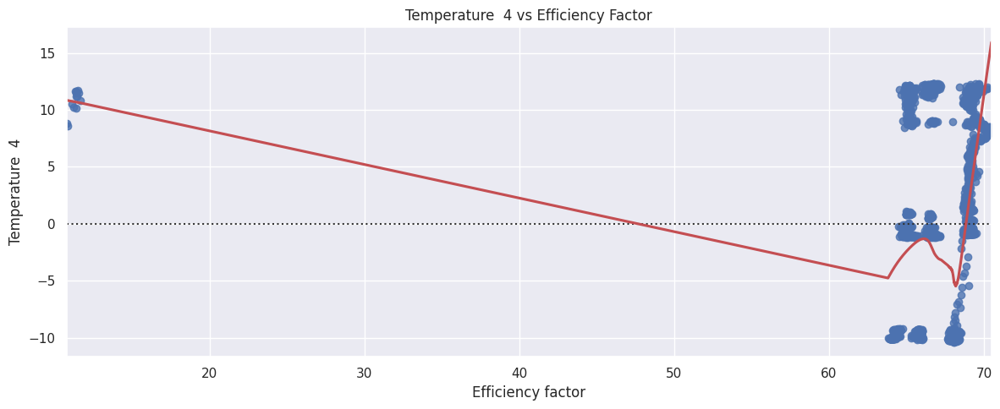

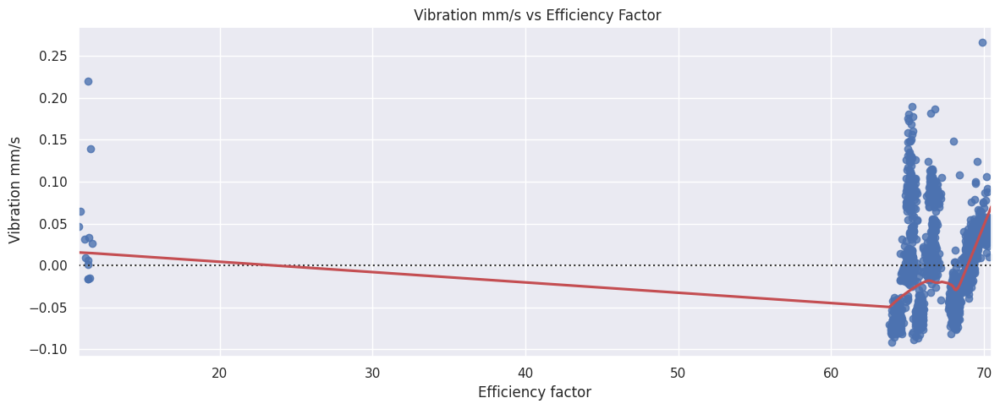

In [ ]:
# regress y on x

for col in col_names:
    sns.residplot(data= df, x= "Efficiency factor", y= col, lowess= True, line_kws= dict(color="r"))
    plt.title(col + ' vs Efficiency Factor')
    plt.show()

In [ ]:
# create an autoregressive moving average (ARMA) model with a lag order of 1 for both the autoregressive and moving average components.

import statsmodels as sm

# create a time series model using the statsmodels library
model = sm.arima_model.ARMA(df['Efficiency factor'], order=(1, 1))

# fit the model to the data
results = model.fit()

# print the summary statistics of the model
print(results.summary())

## Correlations

('Cooling efficiency  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


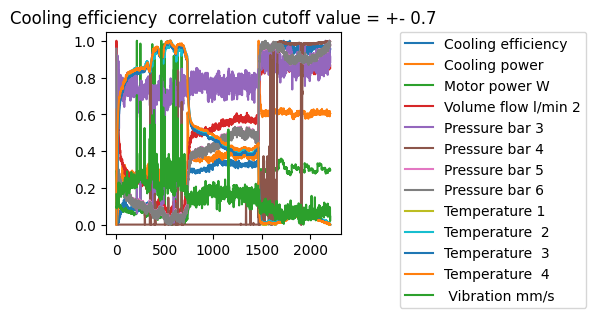

('Cooling power  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


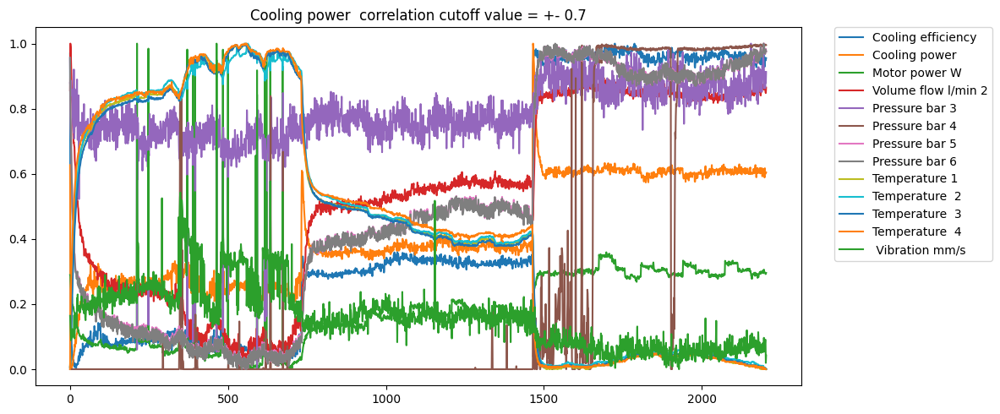

('Motor power W  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4'])


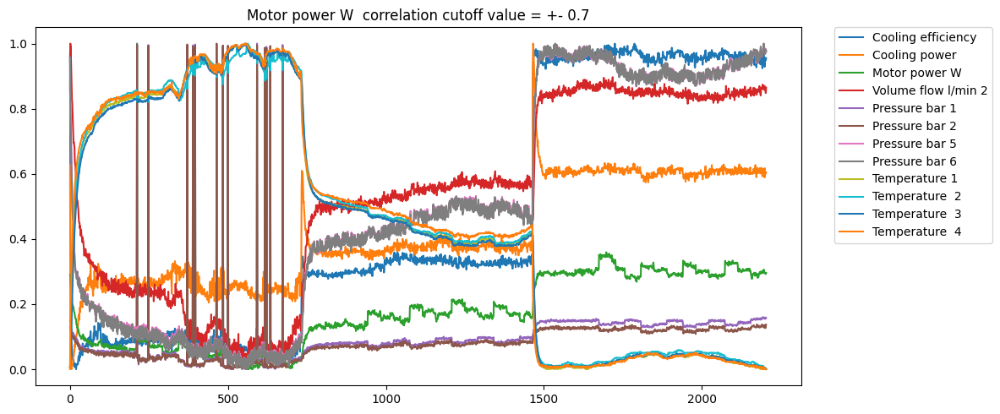

('Volume flow l/min 1  correlation cutoff value = +- 0.7', ['Volume flow l/min 1'])


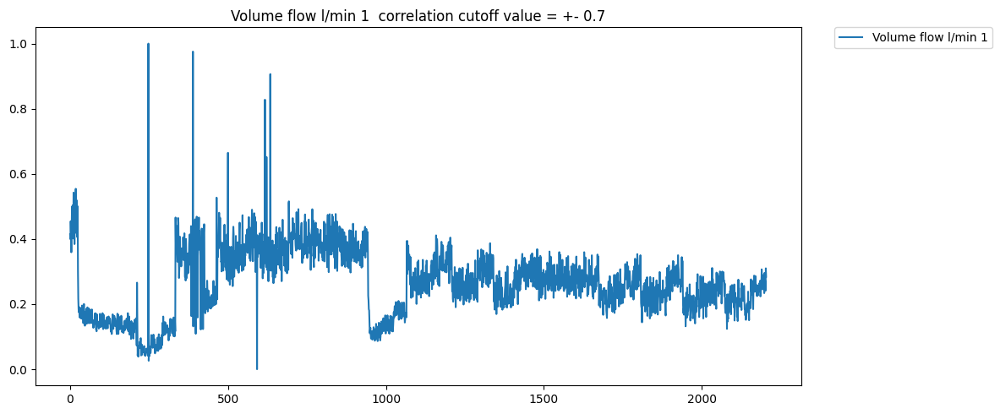

('Volume flow l/min 2  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


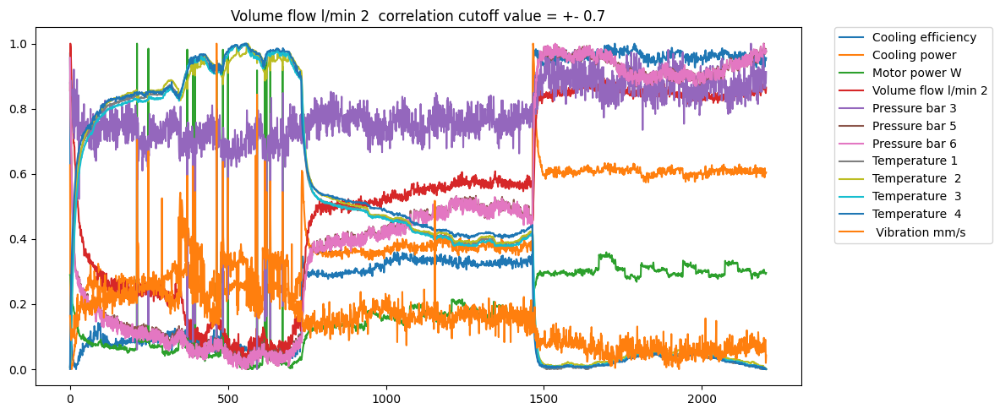

('Pressure bar 1  correlation cutoff value = +- 0.7', ['Motor power W', 'Pressure bar 1', 'Pressure bar 2', 'Efficiency factor'])


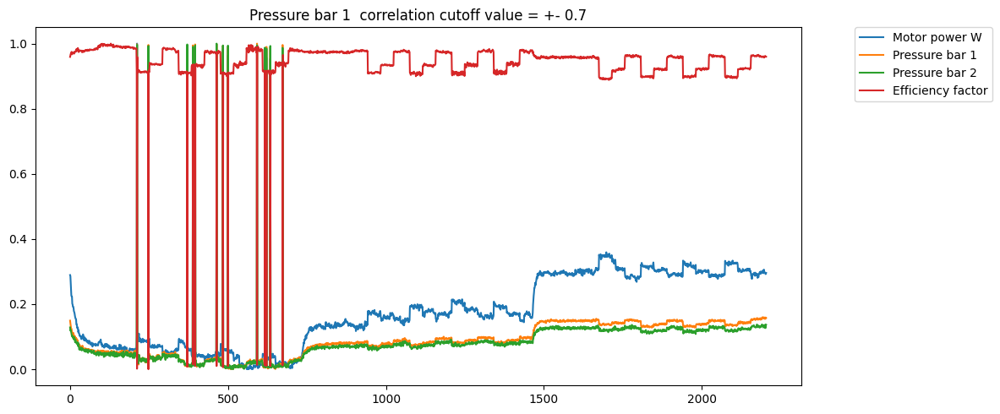

('Pressure bar 2  correlation cutoff value = +- 0.7', ['Motor power W', 'Pressure bar 1', 'Pressure bar 2', 'Efficiency factor'])


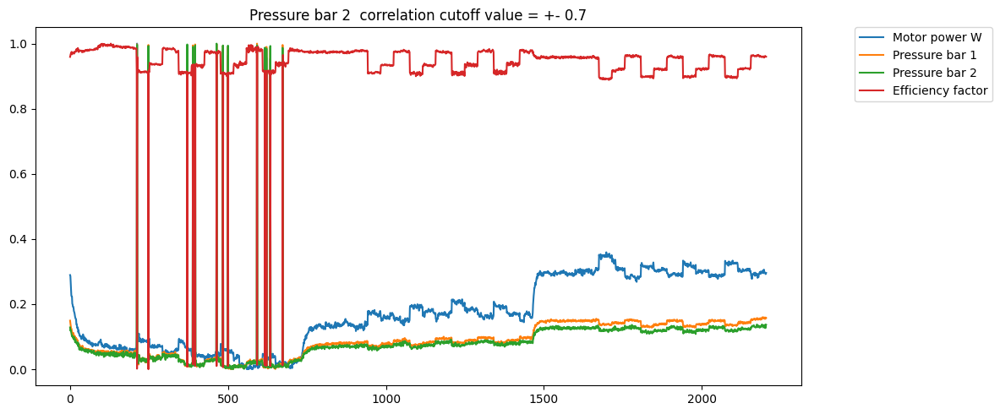

('Pressure bar 3  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


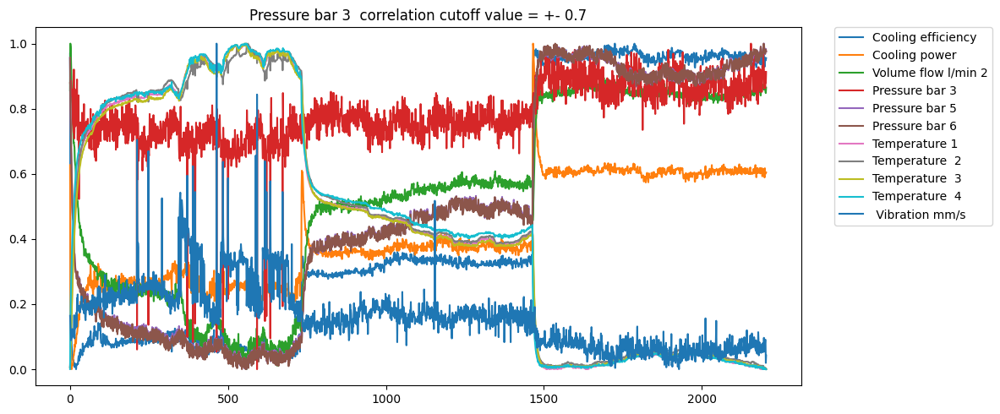

('Pressure bar 4  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  4'])


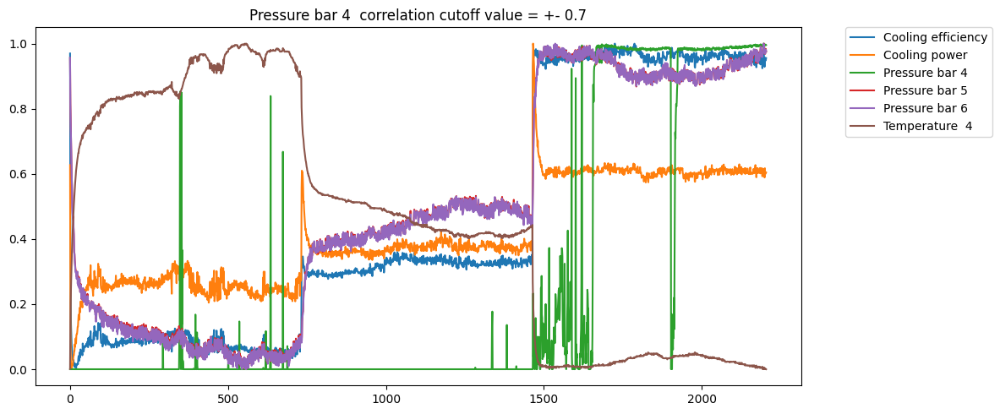

('Pressure bar 5  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


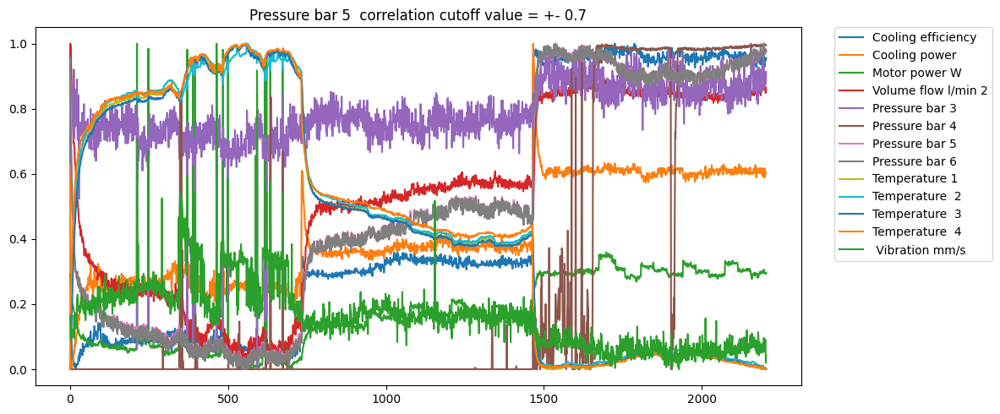

('Pressure bar 6  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


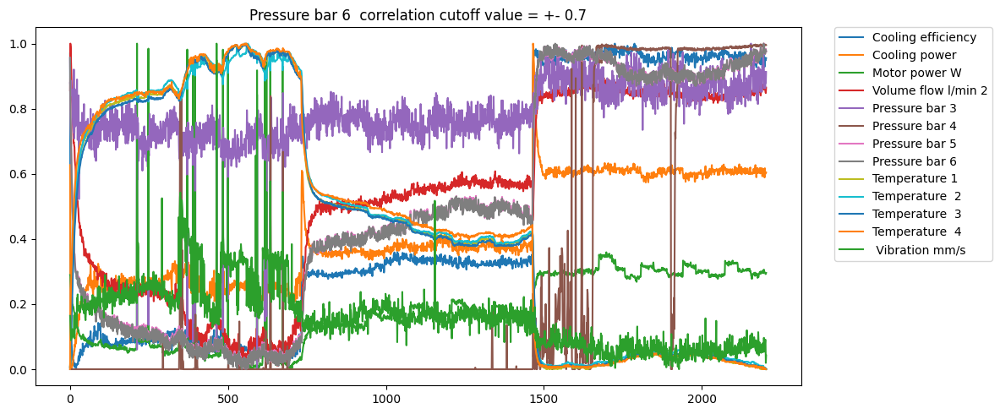

('Efficiency factor  correlation cutoff value = +- 0.7', ['Pressure bar 1', 'Pressure bar 2', 'Efficiency factor'])


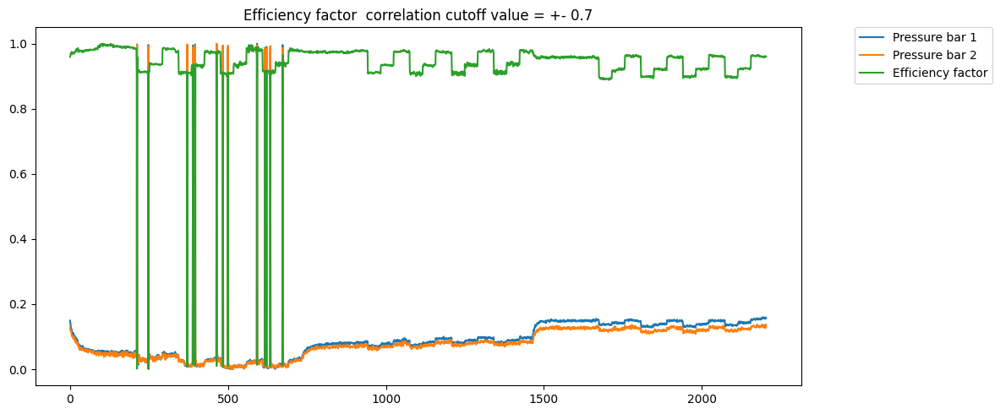

('Temperature 1  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


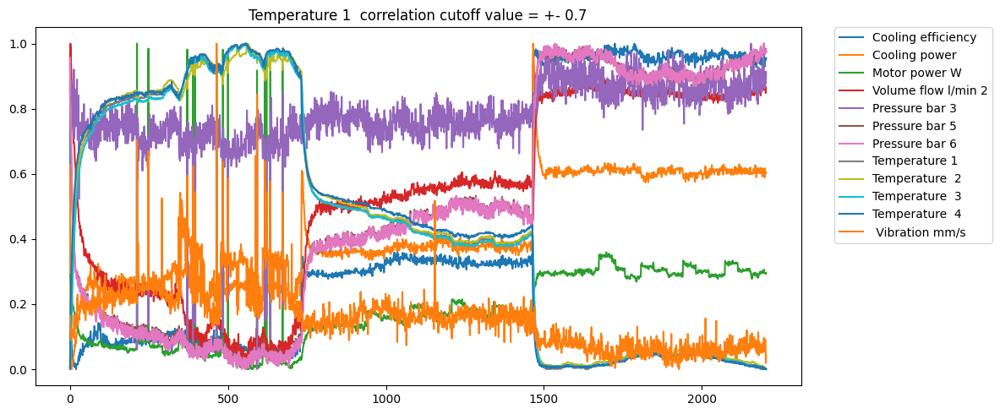

('Temperature  2  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


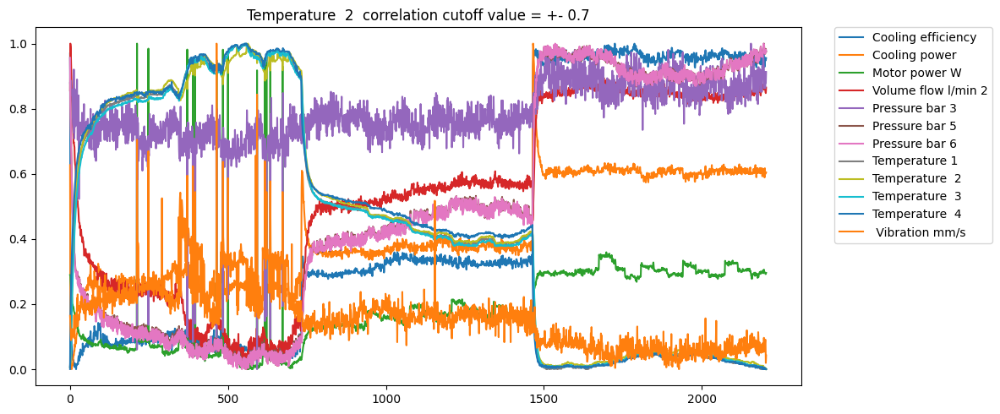

('Temperature  3  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


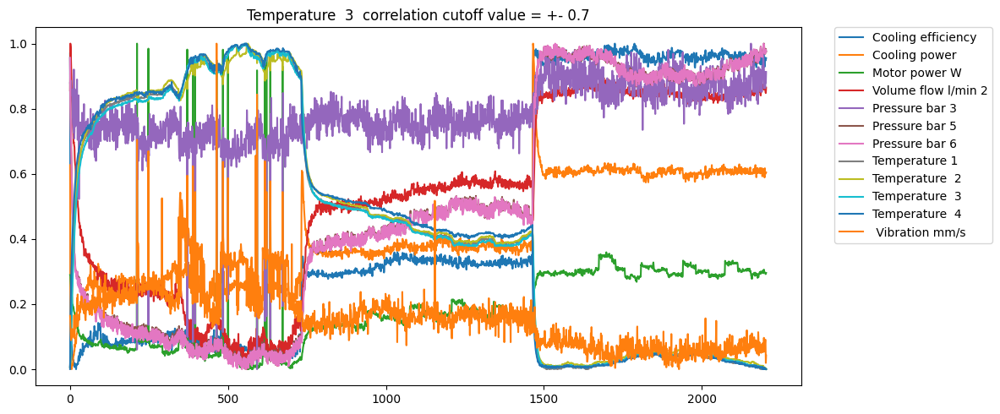

('Temperature  4  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


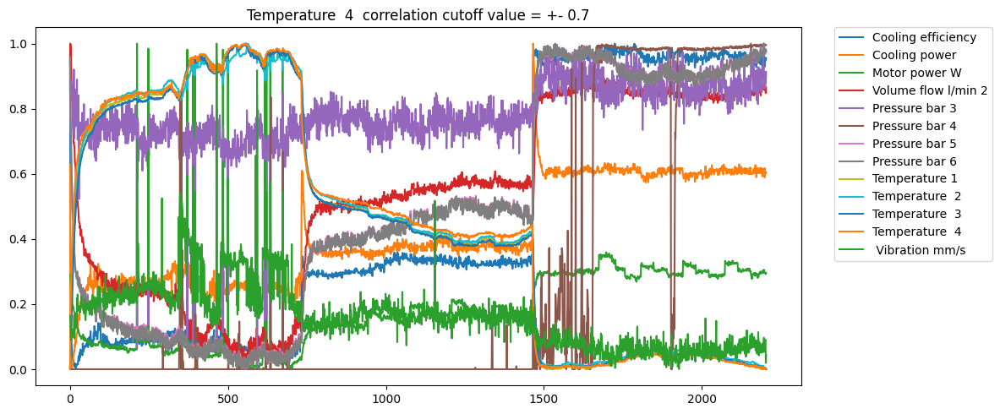

(' Vibration mm/s  correlation cutoff value = +- 0.7', ['Cooling efficiency', 'Cooling power', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s'])


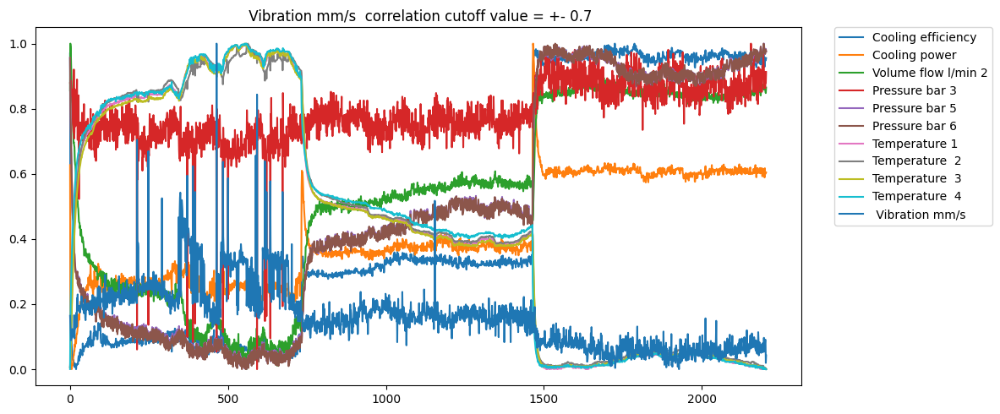

In [40]:

abs_corr_val= .7      # correlation value in absolute we can change 
# columns names without time and date
col_names= ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 1',   
            'Volume flow l/min 2', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 3', 
            'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Efficiency factor', 'Temperature 1',
            'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s']



from sklearn import preprocessing                   
# scikit-learn preprocessing.MinMaxScaler() function to normalize each feature byscaling the data to a range.
# MinMaxScaler() function scales each feature individually so that the values have a given 
# minimum and maximum value, with a default of 0 and 1.
scaler = preprocessing.MinMaxScaler() 
d = scaler.fit_transform(df[col_names])
scaled_df = pd.DataFrame(d, columns=df[col_names].columns)

corr= df[col_names].corr()

list_correlations = []
for row in range(corr.shape[0]):    #for loop to plot all corrleted features according to abs_corr_val
      list_to_plot=[]   # list of column names which within our +- abs_corr_val
      # mask list to be used to determine which feature with our correlation figure - or + abs_corr_val
      mask_list=((corr.iloc[row]>abs_corr_val)|(corr.iloc[row]<-abs_corr_val))* 1  
      for i in range(mask_list.shape[0]):
        if mask_list[i]==1:
          list_to_plot.append(col_names[i])
      print((col_names[row]+ '  correlation cutoff value = +- '+str(abs_corr_val),list_to_plot))  
      list_correlations.append(list_to_plot)

   
      scaled_df[list_to_plot].plot() # we will plot normlized data as there is huge difference between features values
      
      plt.rcParams['figure.figsize'] = [12, 5]
      plt.rcParams["figure.autolayout"] = True # trying to set legend outside
      plt.title(col_names[row]+ '  correlation cutoff value = +- '+ str(abs_corr_val))

      #plt.figure(figsize=(18, 18))
      # set legend outside the chart
      plt.legend(bbox_to_anchor=(1.25, 1), borderaxespad=0)
      plt.show()


## Scatter Plot of Correlations that affects the Efficiency of the system

All correlations will appear in the list, but not all graphs will be plotted in the list, only unique pairs. We consider the pair (a,b) to be equal as (b,a), so it will plotted once. 

In [13]:
for i,col in enumerate(col_names):
    print(i,col)

for i,lc in enumerate(list_correlations):
    print(i,lc)

0 Cooling efficiency
1 Cooling power
2 Motor power W
3 Volume flow l/min 1
4 Volume flow l/min 2
5 Pressure bar 1
6 Pressure bar 2
7 Pressure bar 3
8 Pressure bar 4
9 Pressure bar 5
10 Pressure bar 6
11 Efficiency factor
12 Temperature 1
13 Temperature  2
14 Temperature  3
15 Temperature  4
16  Vibration mm/s
0 ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s']
1 ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s']
2 ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 2', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature

In [15]:
# Save the unique pairs with correlation > 0.7

pairs = dict()

for col, features_list in zip(col_names, list_correlations):

    for feature in features_list:
        if col in pairs:
            pairs[col].append(feature)
        else:
            pairs[col] = [feature]
    pairs[col] = sorted(set(pairs[col]))
    print(col, ':\t', pairs[col])

print(pairs['Volume flow l/min 1'])


unique = set()
for key in pairs:
    for feature in pairs[key]:
        # create the pair if they are not the same feeatue, since we know that ech feature has a perfect correlation with itself
        if key != feature:
            pair = (key, feature)
            pair = sorted(pair)
            # add to the unique pairs set
            unique.add(tuple(pair))

print('Total unique:', len(unique))

Cooling efficiency :	 [' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']
Cooling power :	 [' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']
Motor power W :	 ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']
Volume flow l/min 1 :	 ['Volume flow l/min 1']
Volume flow l/min 2 :	 [' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', '

['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 1', 'Volume flow l/min 2', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Efficiency factor', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s']
16 ['Cooling efficiency', 'Cooling power', 'Motor power W', 'Volume flow l/min 1', 'Volume flow l/min 2', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature 1', 'Temperature  2', 'Temperature  3', 'Temperature  4', ' Vibration mm/s']


Cooling efficiency Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


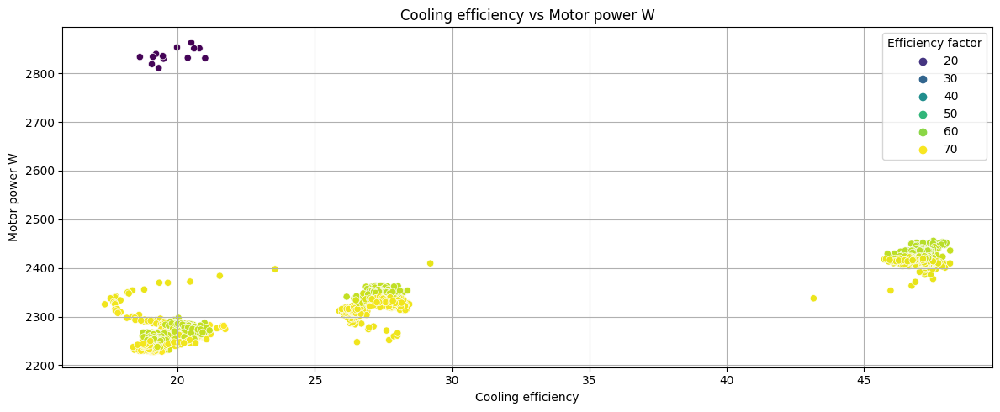

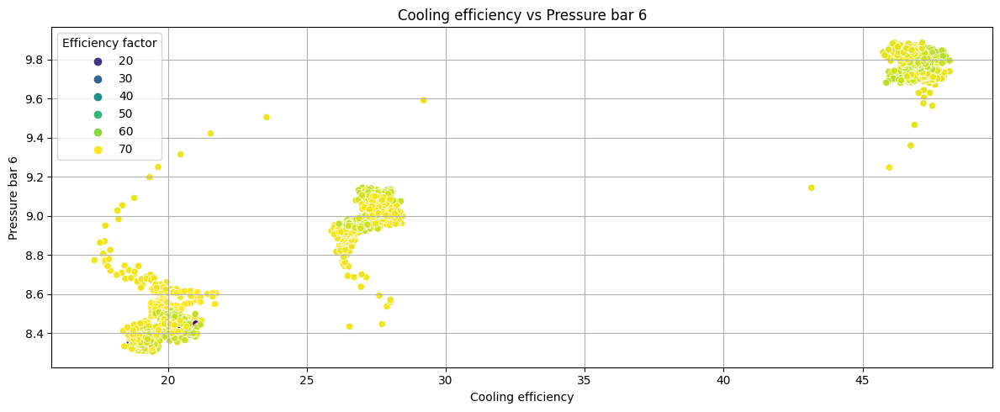

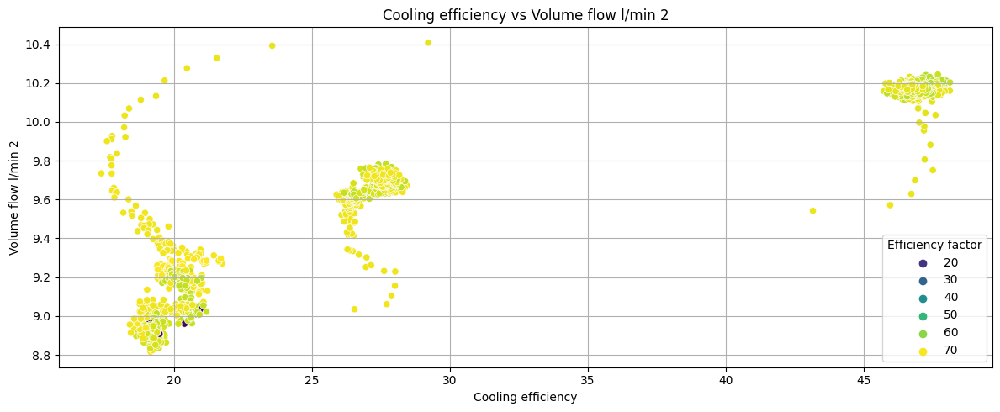

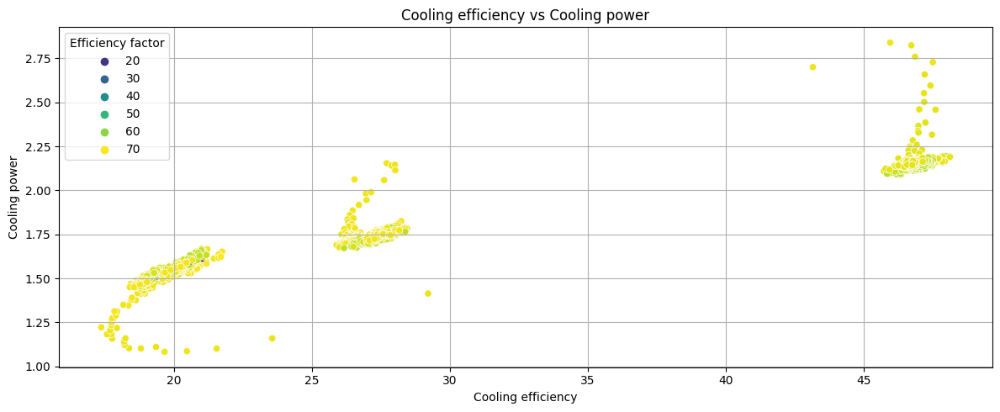

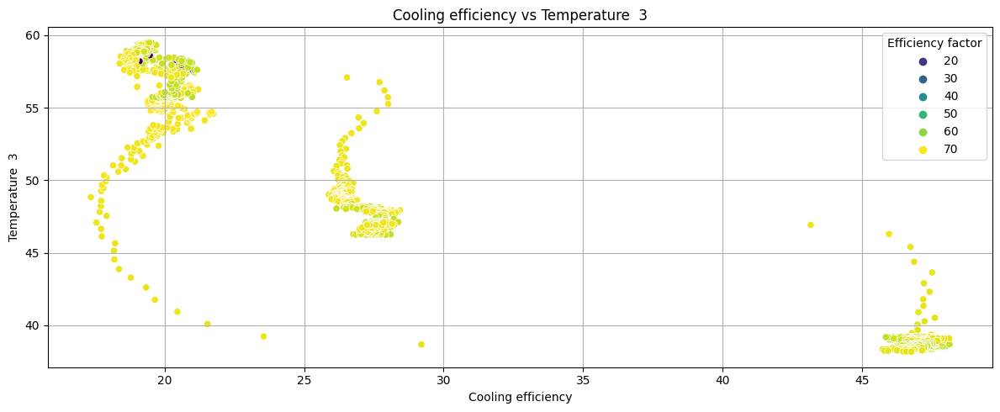

...

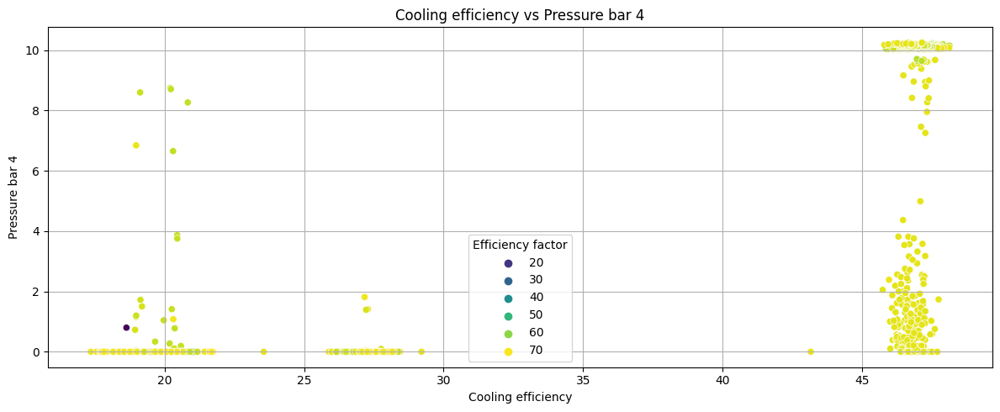

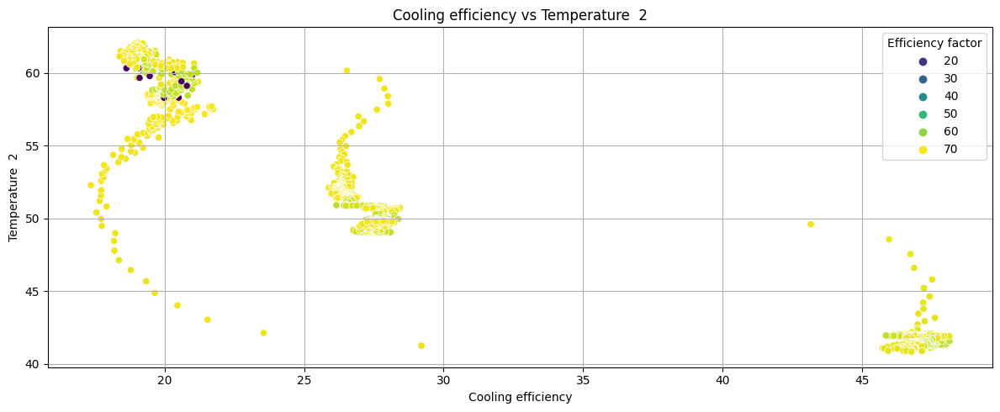

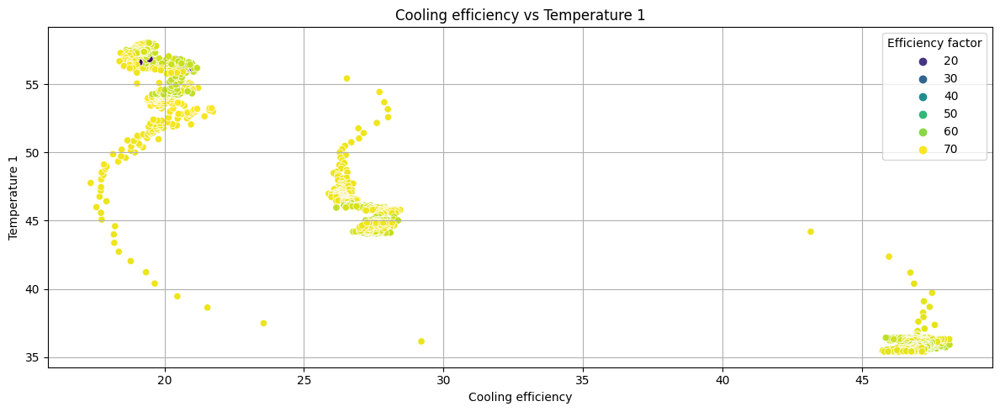

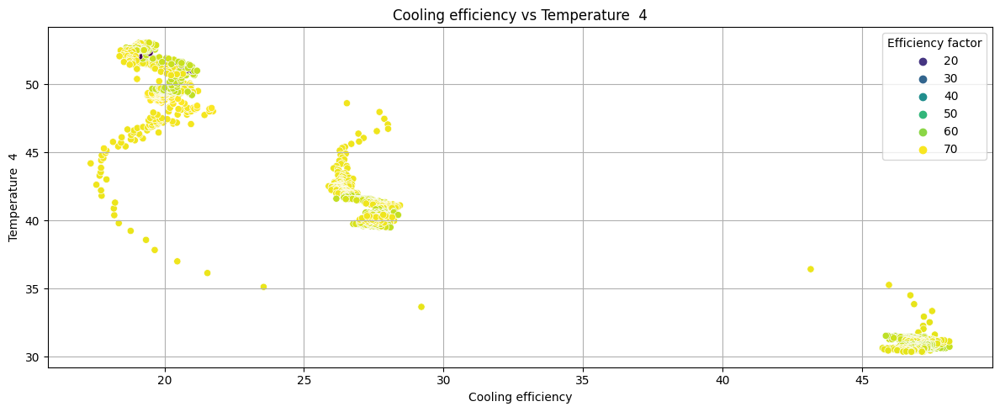

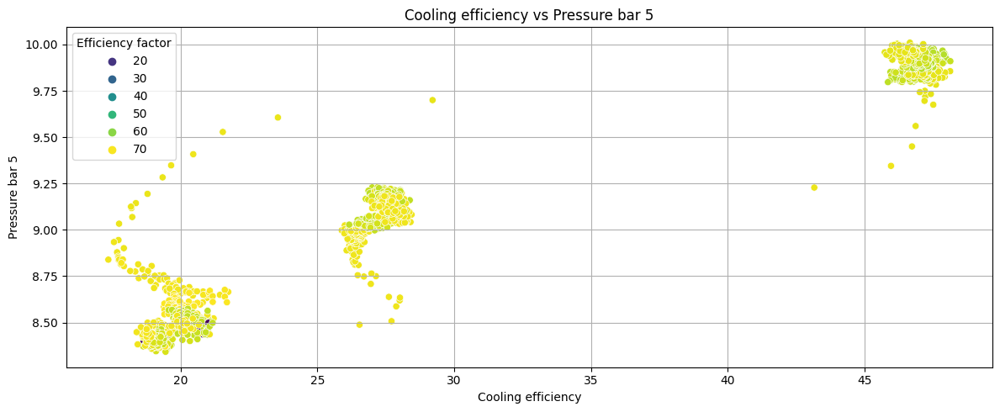

In [22]:
# Scatter Plot of features' pairs with correlation > abs_corr_val (+-0.7)

# drop 'Efficiency factor' from list since it will be the hue in the plot
columns = col_names.copy()
print(columns)
columns.remove('Efficiency factor')
print(len(columns), columns)

# Plot graphs for each col separately
col = columns[0]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

#for pair in unique_pairs:
for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid() 
        plt.show()

In [ ]:
pairs['Cooling efficiency']

[' Vibration mm/s',
 'Cooling efficiency',
 'Cooling power',
 'Motor power W',
 'Pressure bar 3',
 'Pressure bar 4',
 'Pressure bar 5',
 'Pressure bar 6',
 'Temperature  2',
 'Temperature  3',
 'Temperature  4',
 'Temperature 1',
 'Volume flow l/min 2']

**Colling Efficiency** has high correlations with: 
- Pressure bar 3,4,5,6
- Temperature 1,2,3,4
- Volume flow 2
- Motor Power
- Colling Power 
- Colling Efficiency
- Vibration

From the graphs above, we can infer that the **Efficiency factor** of the system is affected only when:

    Cooling efficiency < 25 and:
        - Motor power W > 2800
        - Pressure bar 3 < 1







Cooling power Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


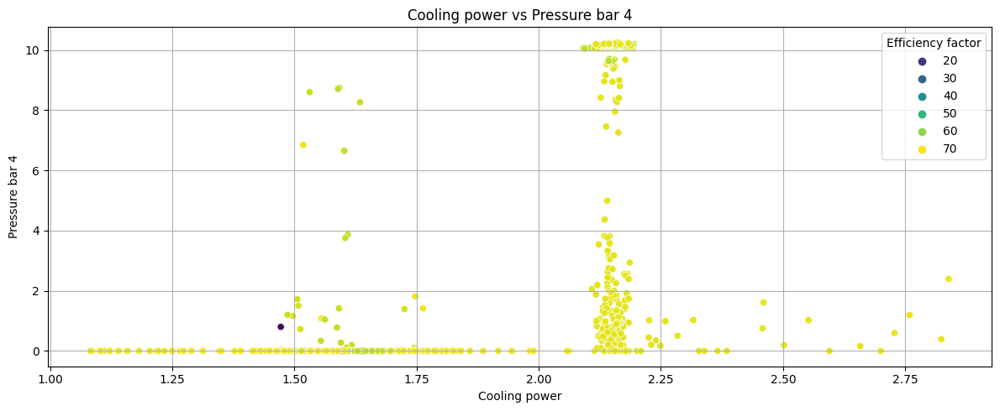

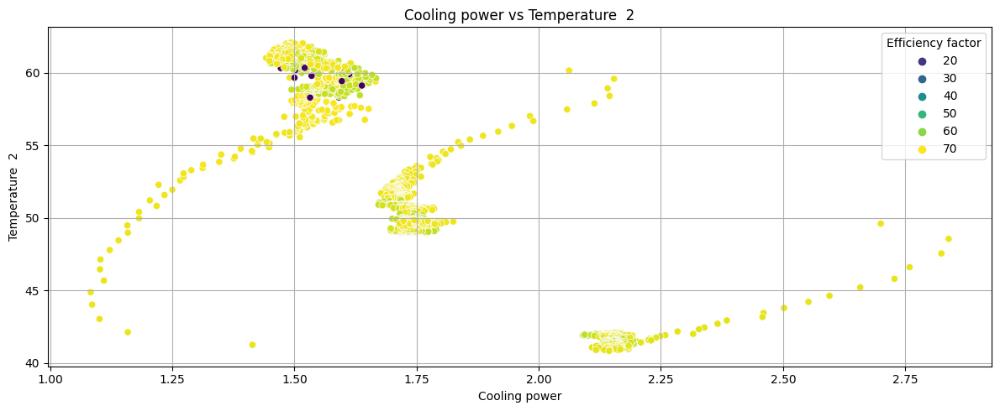

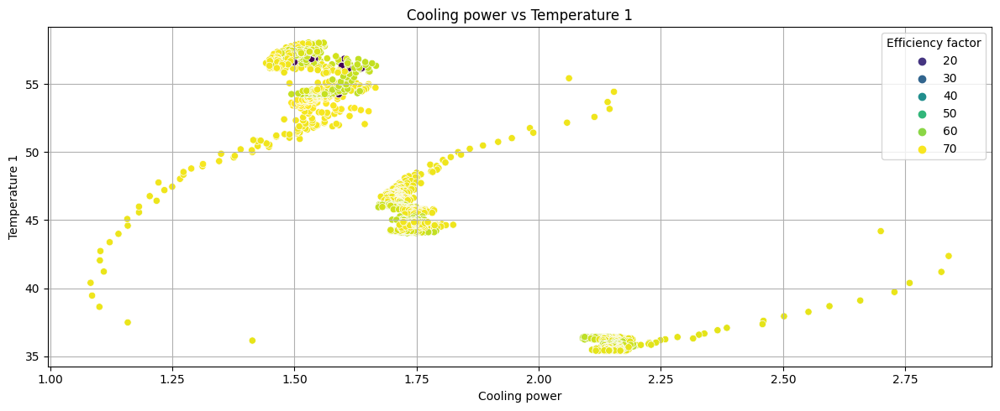

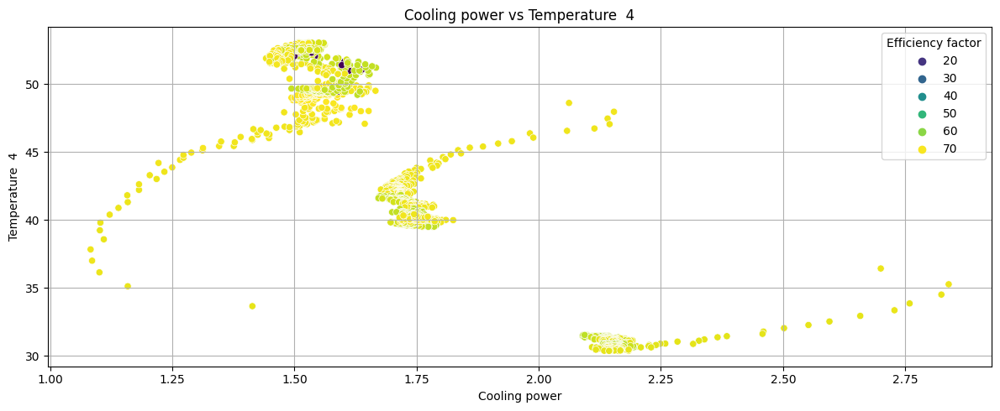

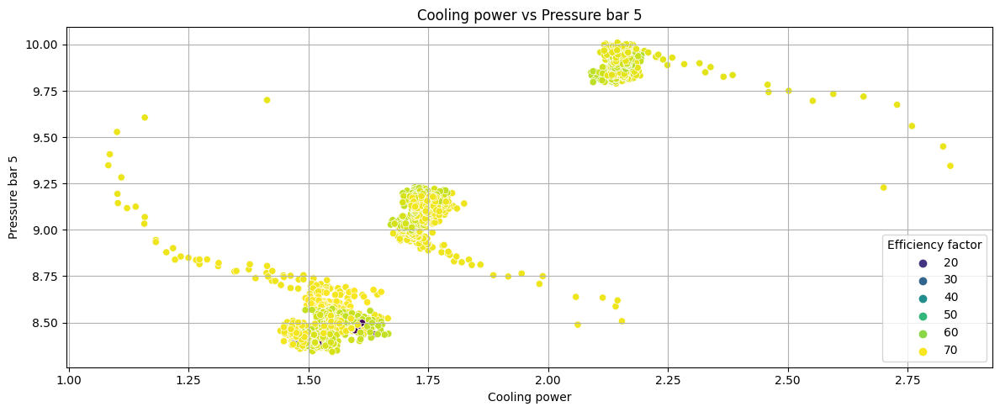

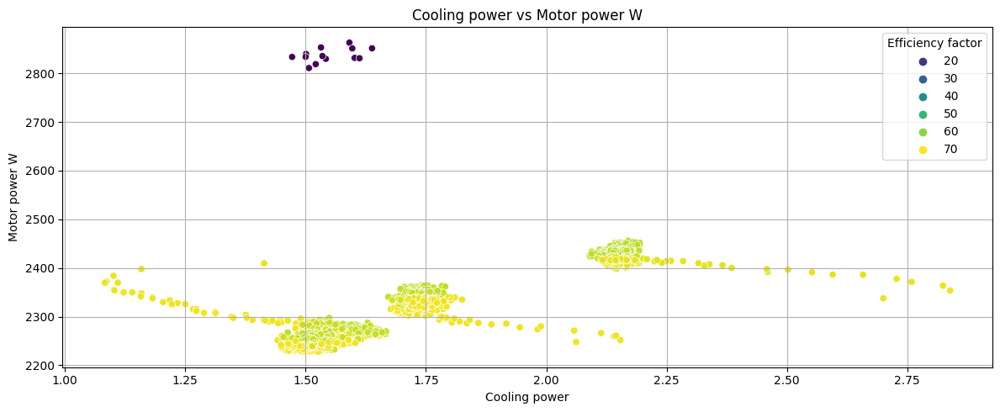

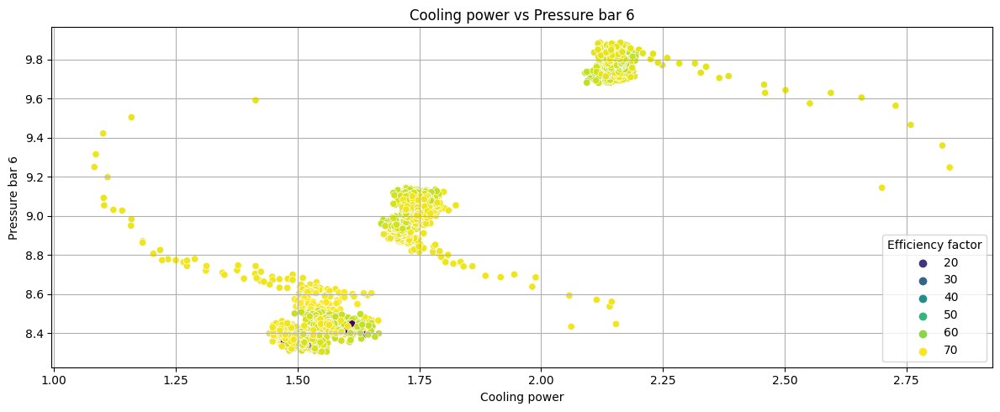

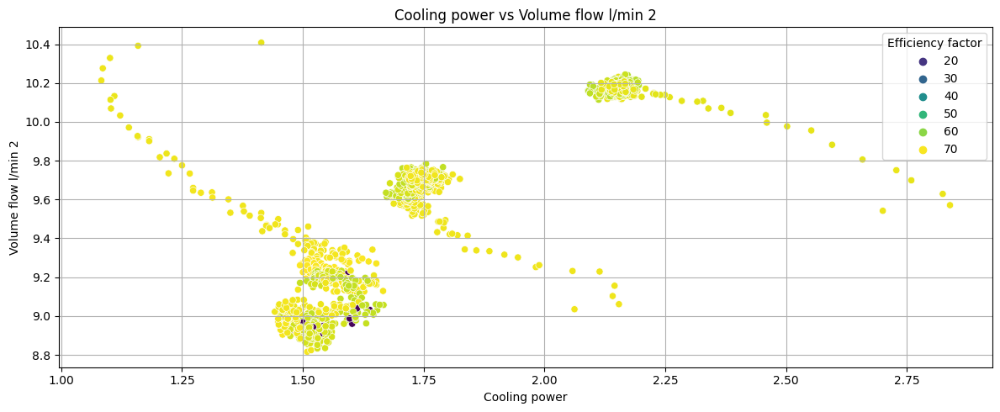

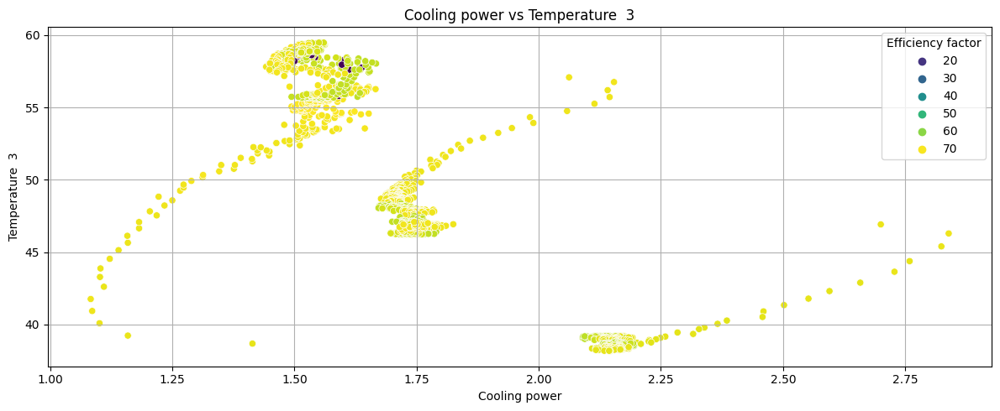

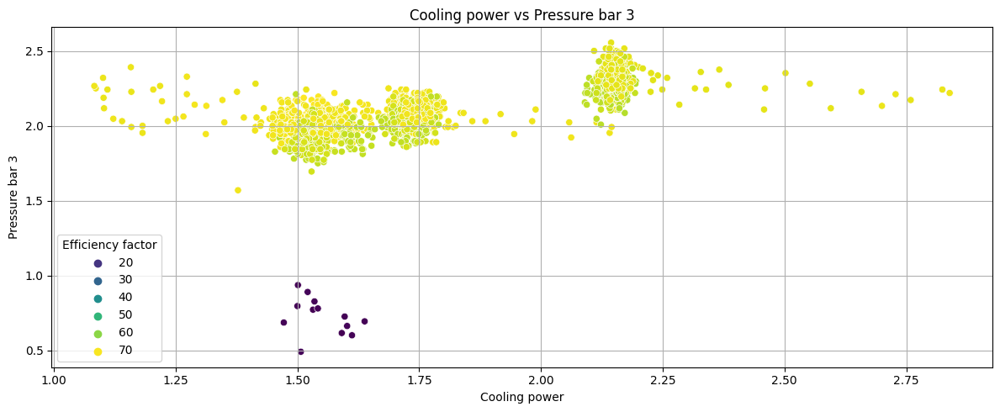

In [23]:
col = columns[1]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

# for pair in unique_pairs:
for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

In [ ]:
pairs['Cooling power']

[' Vibration mm/s',
 'Cooling efficiency',
 'Cooling power',
 'Motor power W',
 'Pressure bar 3',
 'Pressure bar 4',
 'Pressure bar 5',
 'Pressure bar 6',
 'Temperature  2',
 'Temperature  3',
 'Temperature  4',
 'Temperature 1',
 'Volume flow l/min 2']

**Colling Power** has high correlations with: 
- Pressure bar 3,4,5,6
- Temperature 1,2,3,4
- Volume flow 2
- Motor Power
- Cooling Power
- Cooling Efficiency
- Vibration

From the graphs above, we can infer that the **Efficiency factor** of the system is affected when:

    Cooling power < 1.75 and 
        - Motor power W > 2500
        - Pressure bar 3 < 1.5




Motor power W Correlations > +- 0.7
['Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 1', 'Pressure bar 2', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


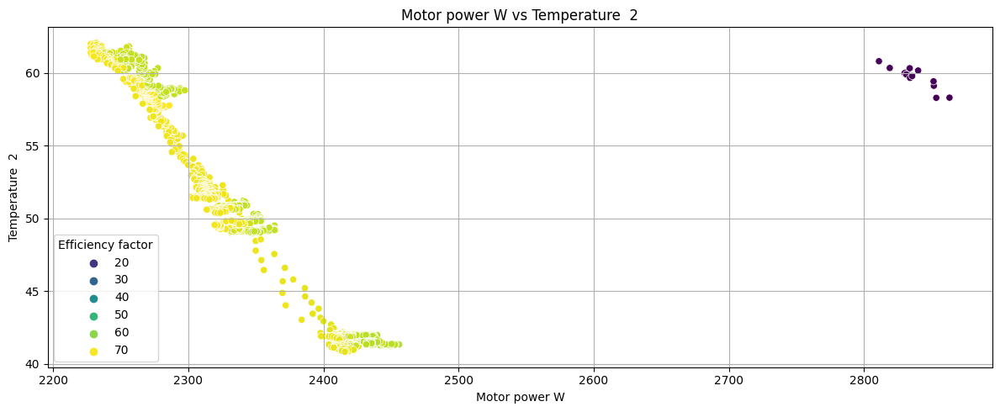

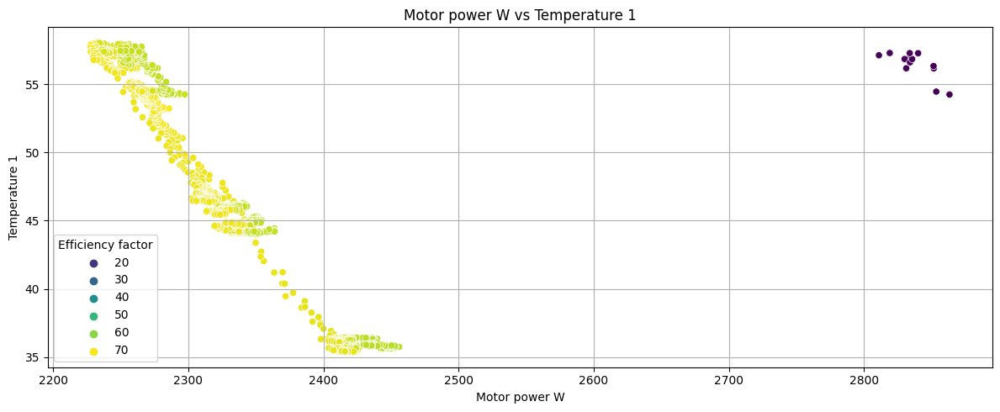

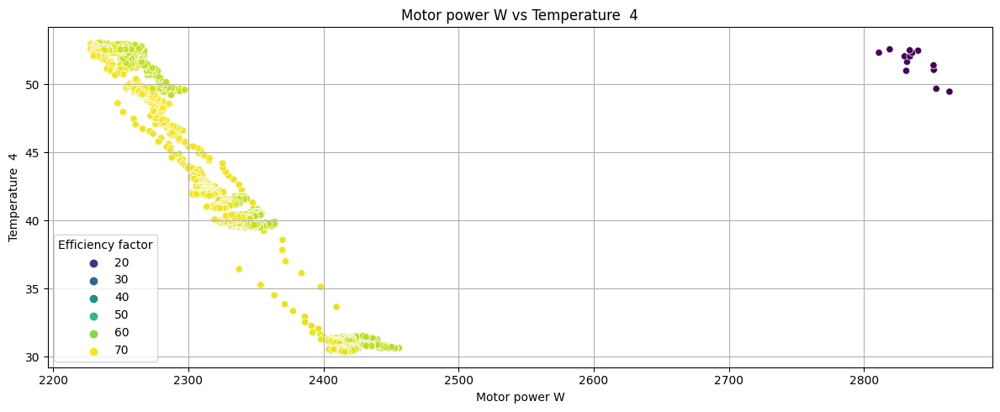

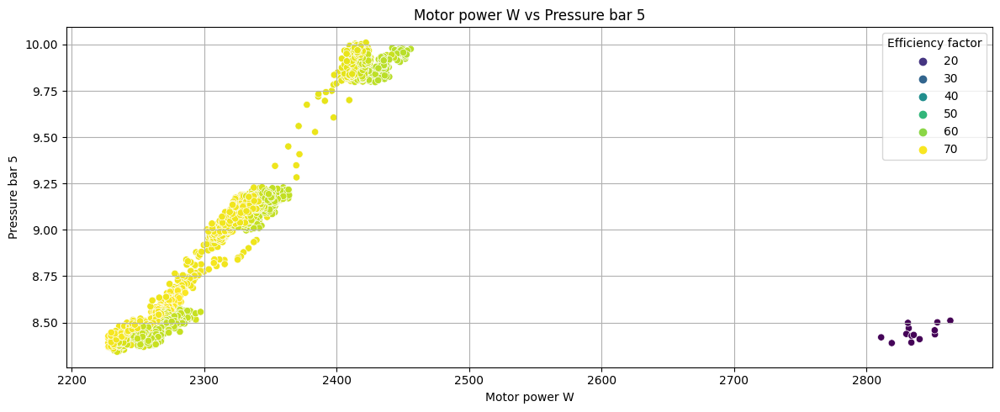

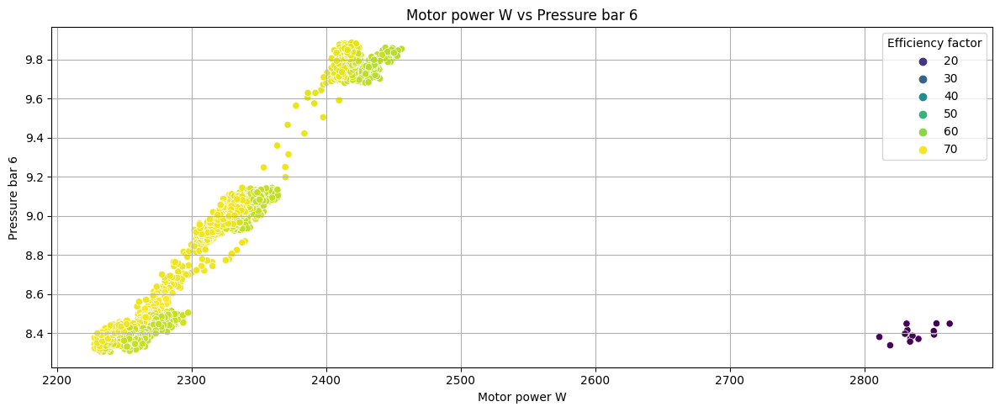

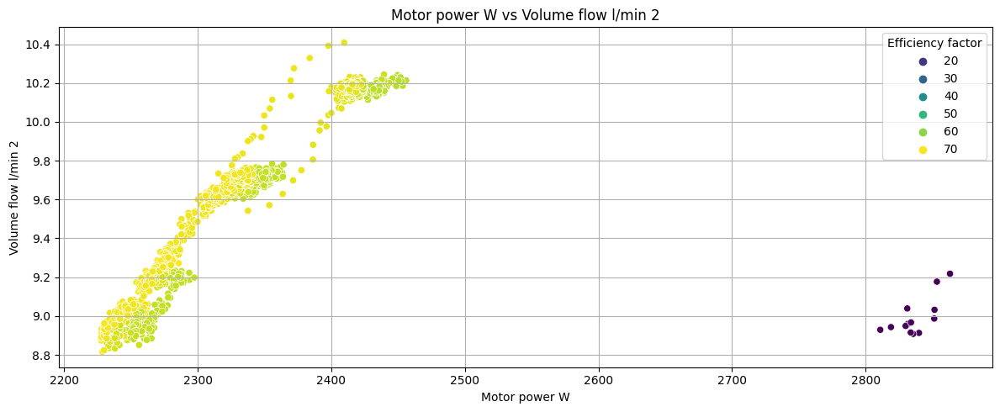

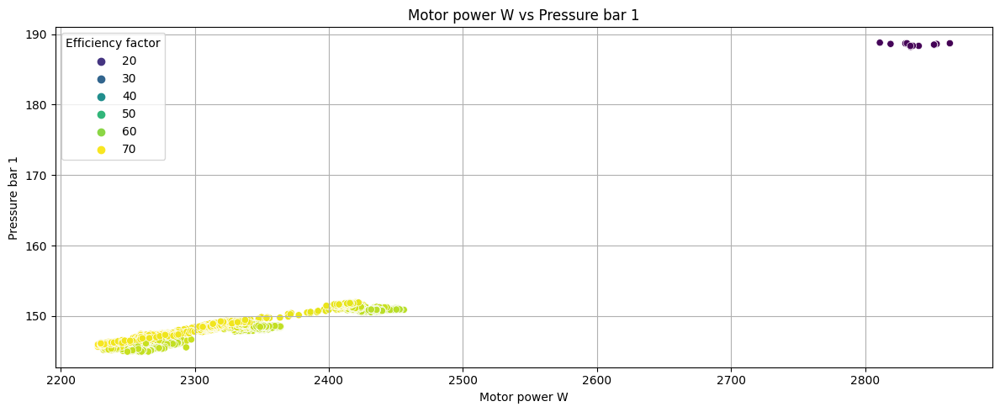

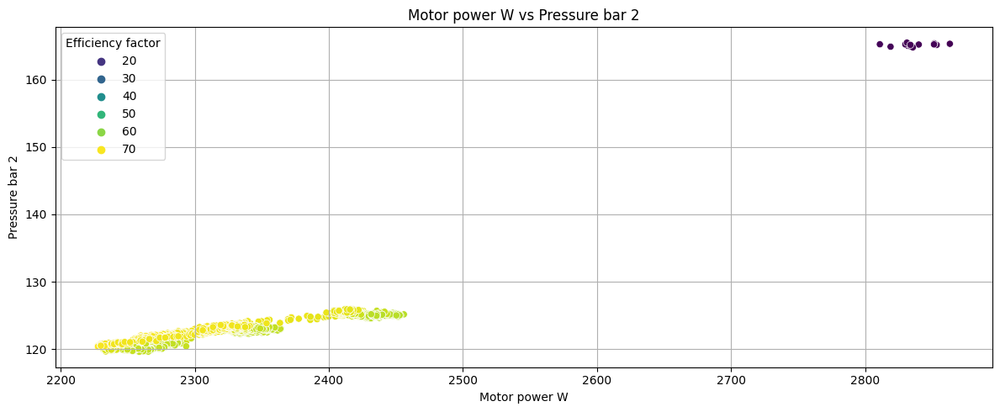

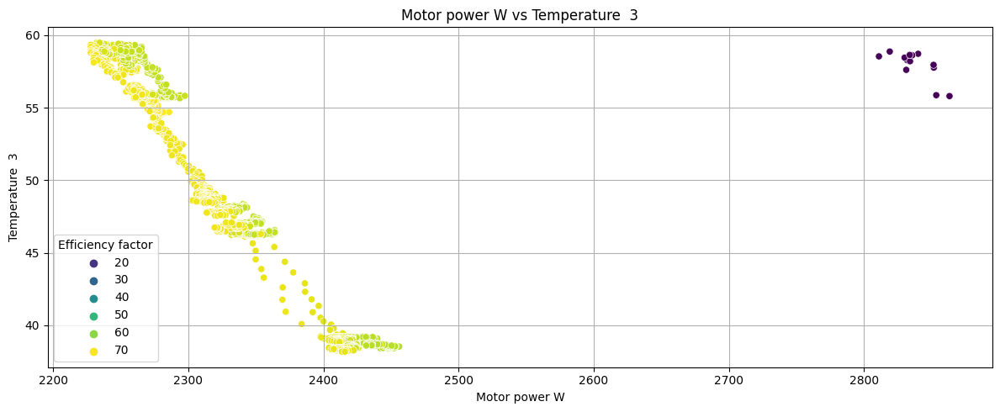

In [24]:
col = columns[2]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

# for pair in unique_pairs:
for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

In [ ]:
pairs['Motor power W']

['Cooling efficiency',
 'Cooling power',
 'Motor power W',
 'Pressure bar 1',
 'Pressure bar 2',
 'Pressure bar 5',
 'Pressure bar 6',
 'Temperature  2',
 'Temperature  3',
 'Temperature  4',
 'Temperature 1',
 'Volume flow l/min 2']

**Motor Power** has high correlations with: 

- Cooling efficiency
- Cooling power
- Pressure bar 1,2,5,6
- Temperature 1,2,3,4
- Vibration mm/s
- Volume flow 2


From the graphs above, we can infer that the **Efficiency factor** of the system is affected only when:

    Motor power > 2500 and 
        - Pressure bar 1 > 160
        - Pressure bar 2 > 130


In [42]:
col = columns[3]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()



Volume flow l/min 1 Correlations > +- 0.7
['Volume flow l/min 1']


**Volume flow 1** has high correlations with: 

- Volume flow 1 (itself)


In [ ]:
col = columns[4]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()



Volume flow l/min 2 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


In [ ]:
pairs['Volume flow l/min 2']

[' Vibration mm/s',
 'Cooling efficiency',
 'Cooling power',
 'Motor power W',
 'Pressure bar 3',
 'Pressure bar 5',
 'Pressure bar 6',
 'Temperature  2',
 'Temperature  3',
 'Temperature  4',
 'Temperature 1',
 'Volume flow l/min 2']

**Volume flow 2** has high correlations with: 

- Cooling efficiency
- Cooling power
- Efficiency factor
- Motor power
- Pressure bar 1,2,3,4,5,6
- Temperature 1,2,3,4
- Vibration mm/s
- Volume flow 2 (itself)




Pressure bar 1 Correlations > +- 0.7
['Efficiency factor', 'Motor power W', 'Pressure bar 1', 'Pressure bar 2']


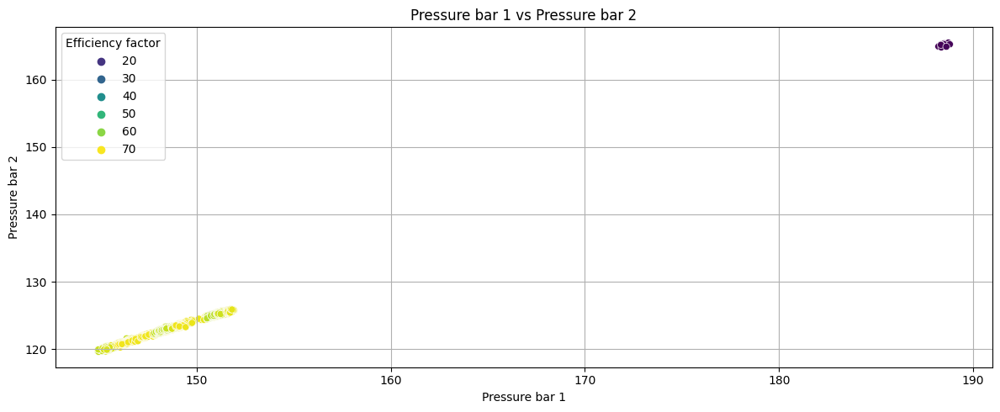

In [26]:
col = columns[5]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

In [ ]:
pairs['Pressure bar 1']

['Efficiency factor', 'Motor power W', 'Pressure bar 1', 'Pressure bar 2']

**Pressure bar 1** has high correlations with: 

- Efficiency factor
- Motor power
- Pressure bar 1,2


From the graph above, we can infer that the **Efficiency factor** of the system is affected only when:

    Pressure bar 1 > 160 and 
        - Pressure bar 2 > 130

In [28]:
col = columns[6]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()



Pressure bar 2 Correlations > +- 0.7
['Efficiency factor', 'Motor power W', 'Pressure bar 1', 'Pressure bar 2']


**Pressure bar 2** has high correlations with: 

- Efficiency factor
- Motor power
- Pressure bar 1,2




Pressure bar 3 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


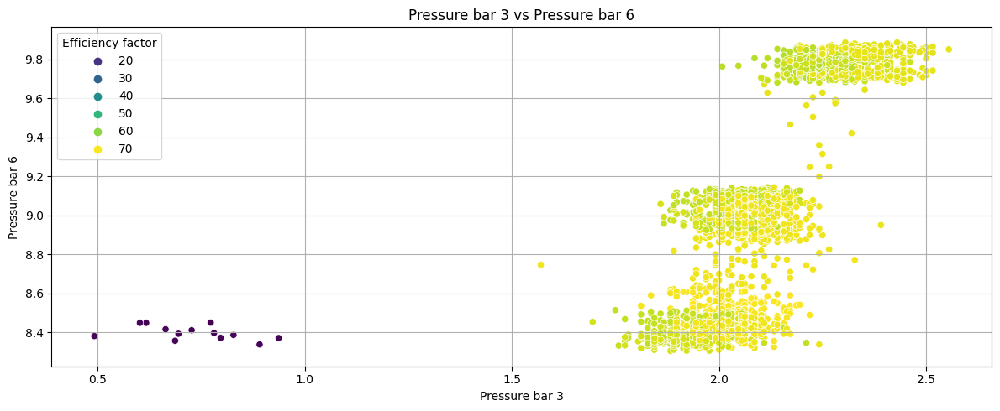

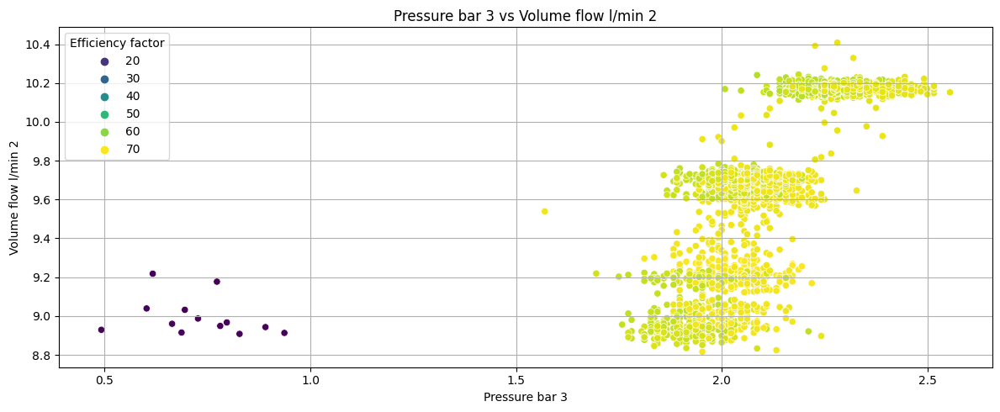

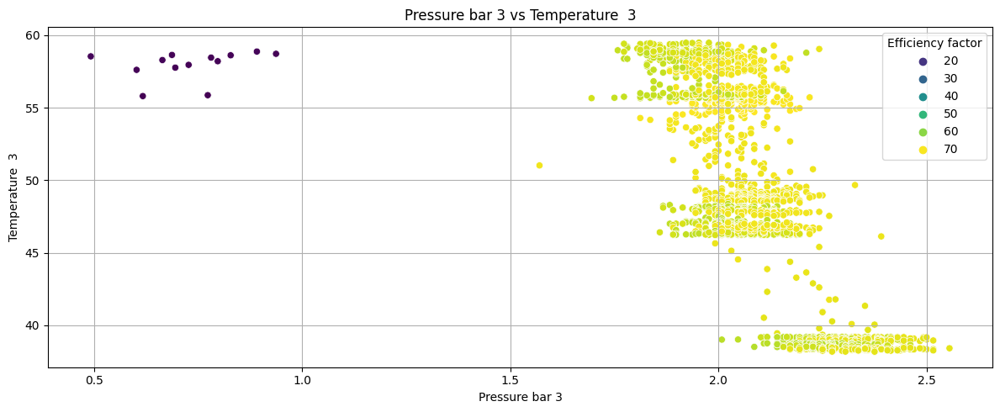

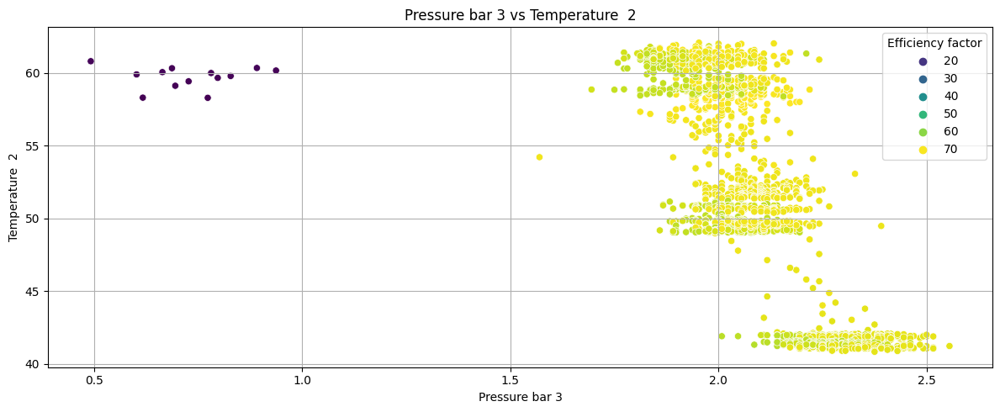

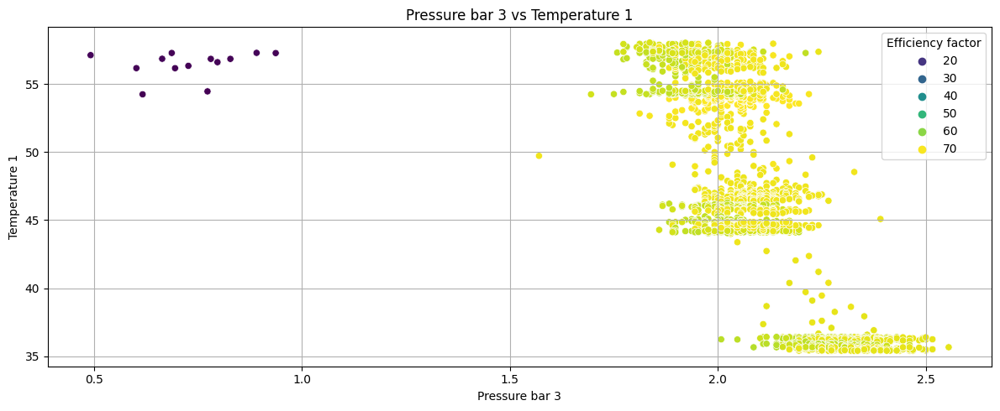

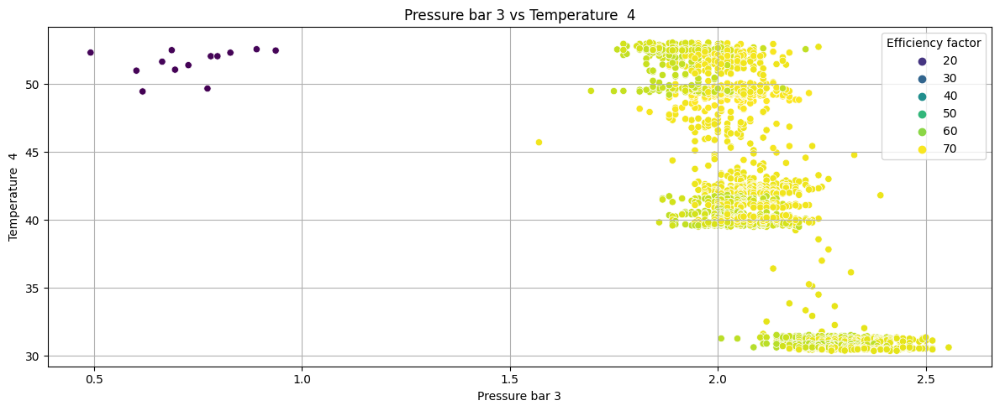

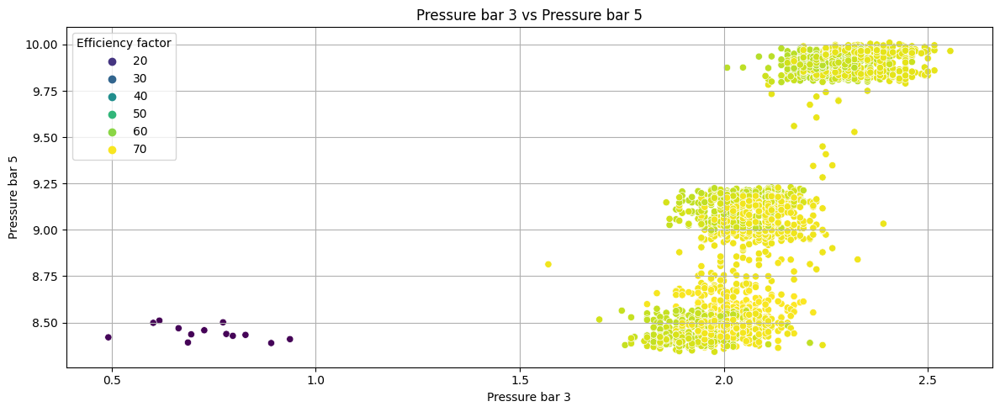

In [27]:
col = columns[7]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Pressure bar 3** has high correlations with: 

- Cooling efficiency
- Cooling power
- Pressure bar 3, 5, 6
- Temperature  1,2,3,4
- Volume flow 2
- Vibration mm/s

None of the graphs above show an impact of these correlations on Efficiency factor of the system



Pressure bar 4 Correlations > +- 0.7
['Cooling efficiency', 'Cooling power', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  4']


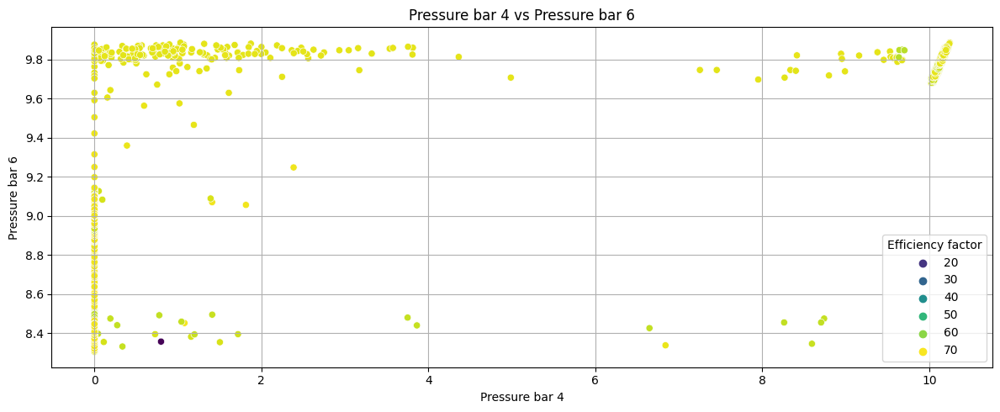

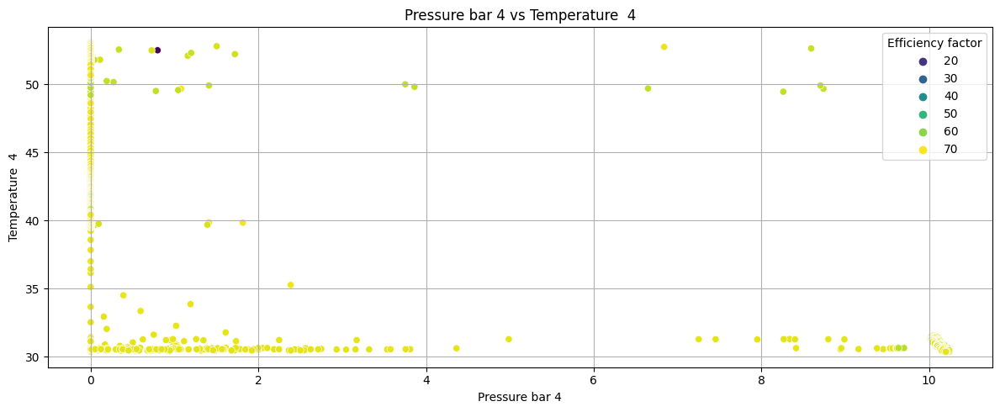

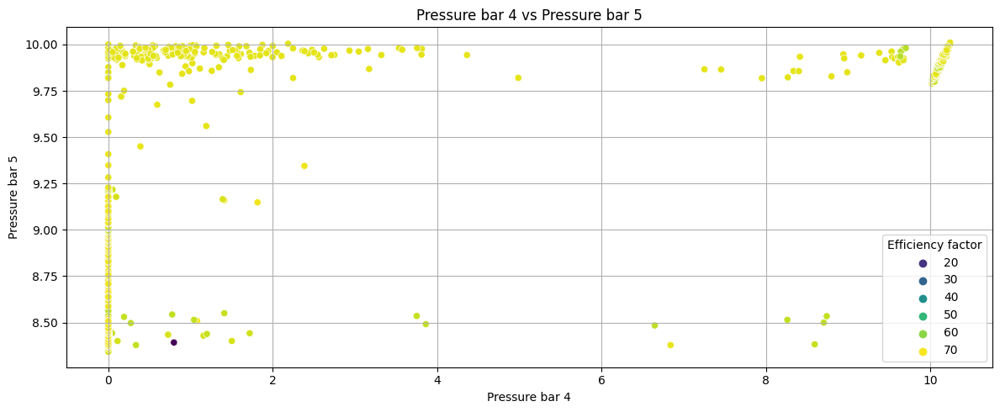

In [29]:
col = columns[8]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Pressure bar 4** has high correlations with: 

- Cooling efficiency
- Cooling power
- Pressure bar 4, 5, 6
- Temperature  4


None of the graphs above show an impact of these correlations on Efficiency factor of the system



Pressure bar 5 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


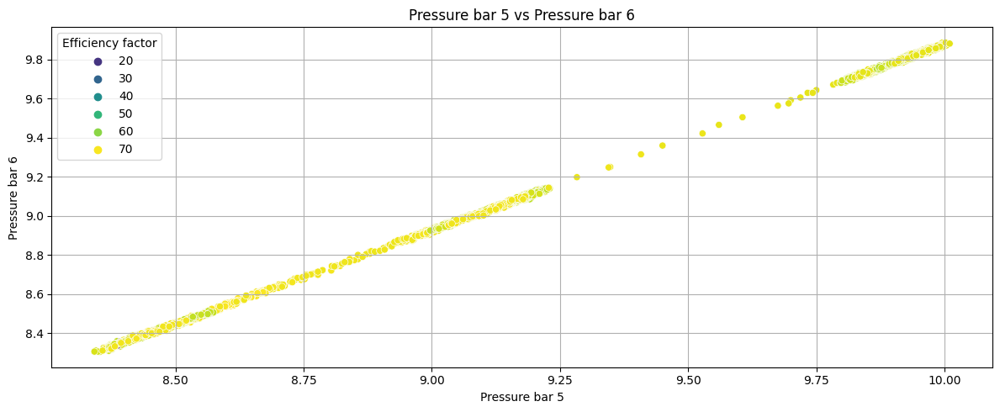

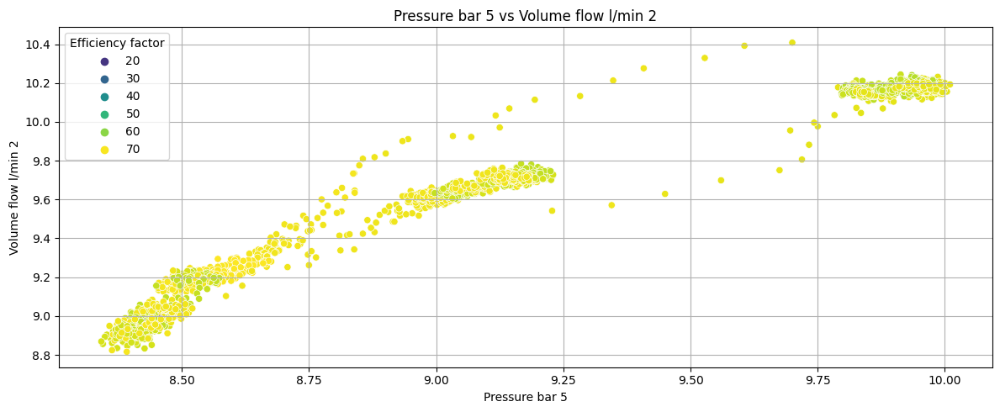

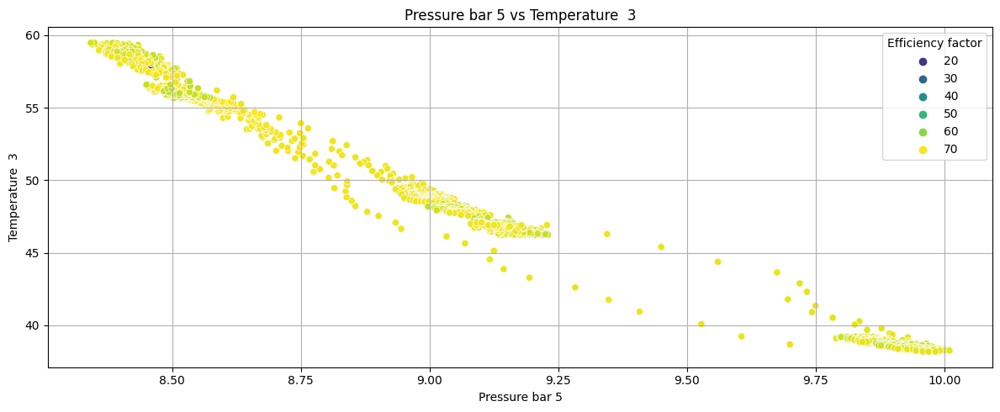

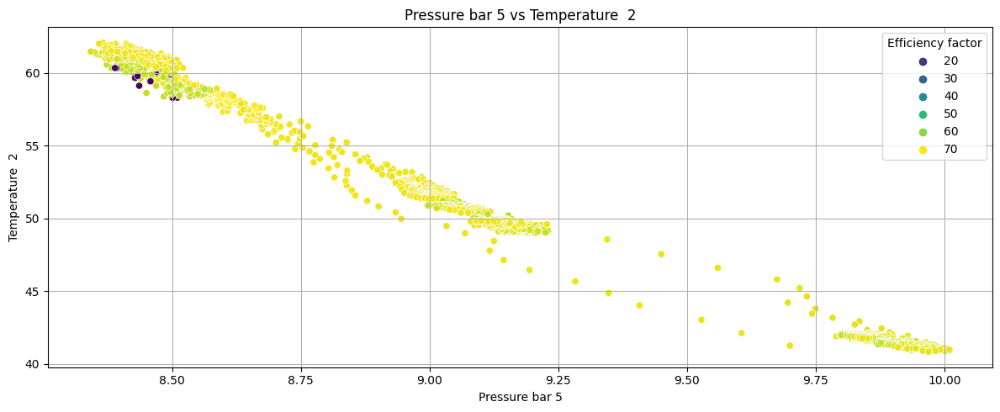

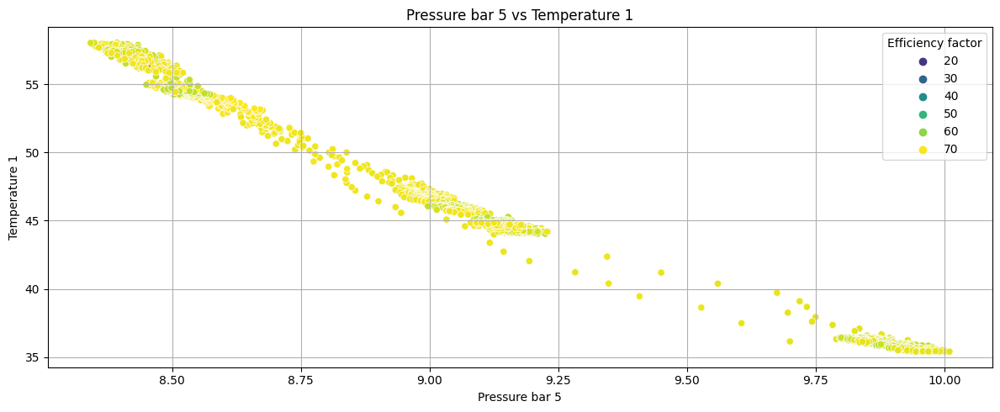

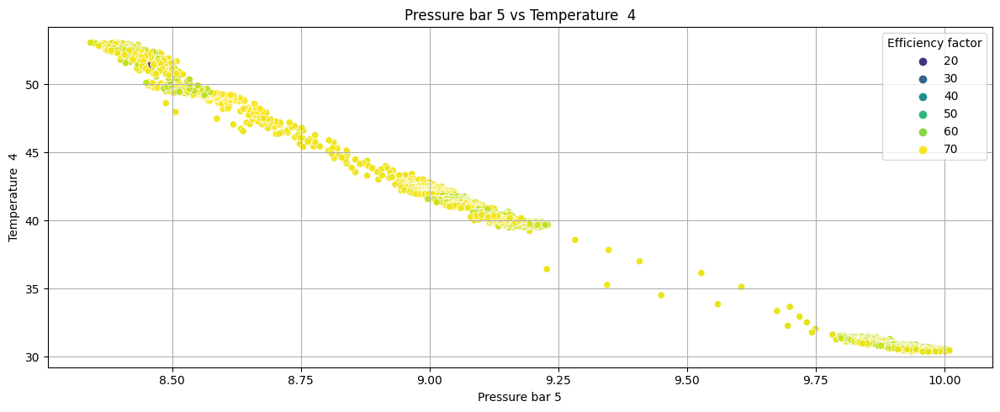

In [41]:
col = columns[9]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Pressure bar 5** has high correlations with: 

- Cooling efficiency
- Cooling power
- Motor power
- Pressure bar 3, 4, 5, 6
- Temperature  3, 4
- Vibration
- Volume flow 2

None of the graphs above show an impact of these correlations on the Efficiency factor of the system



Pressure bar 6 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


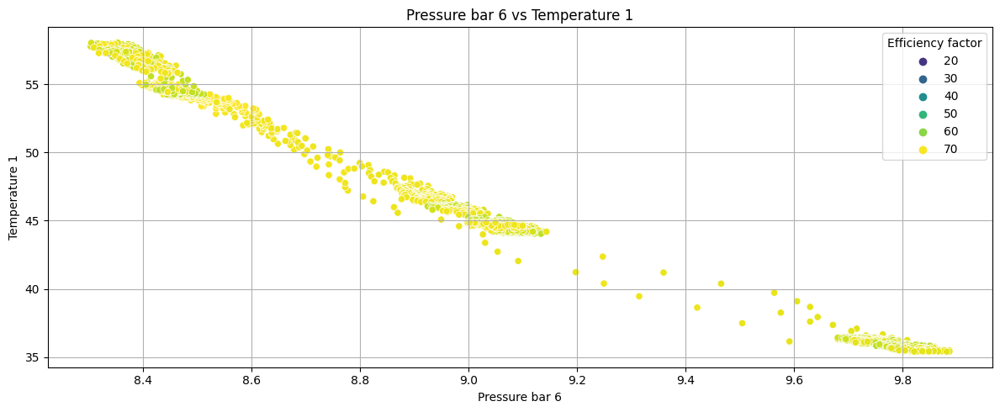

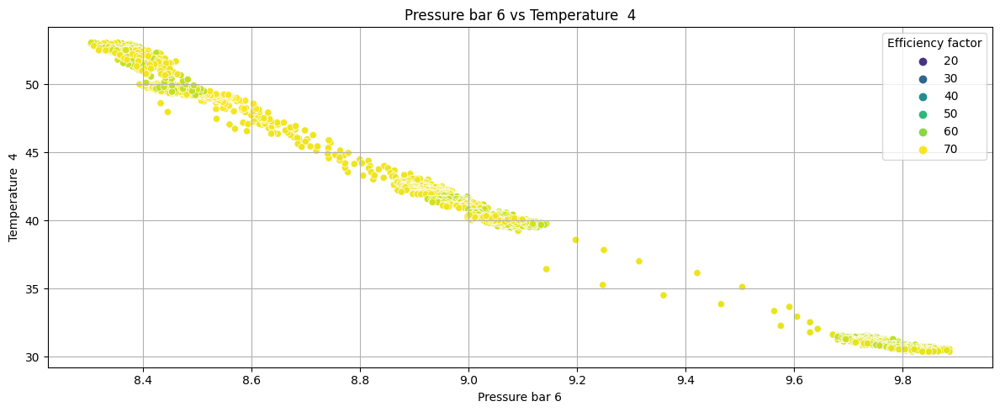

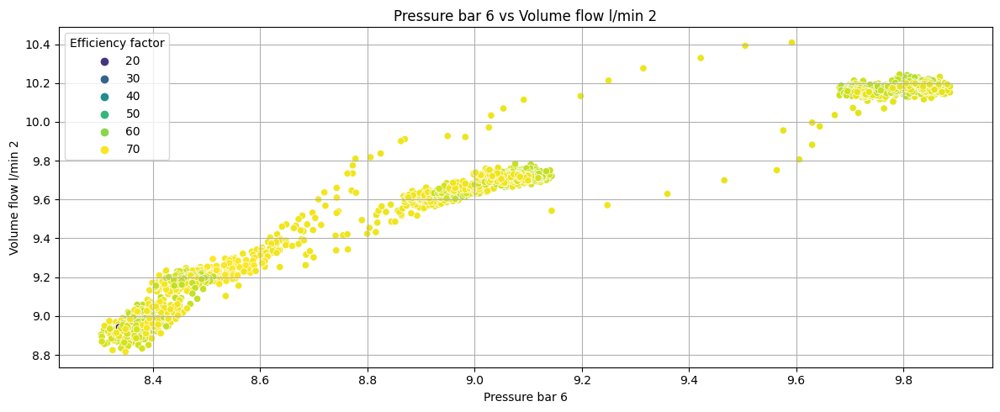

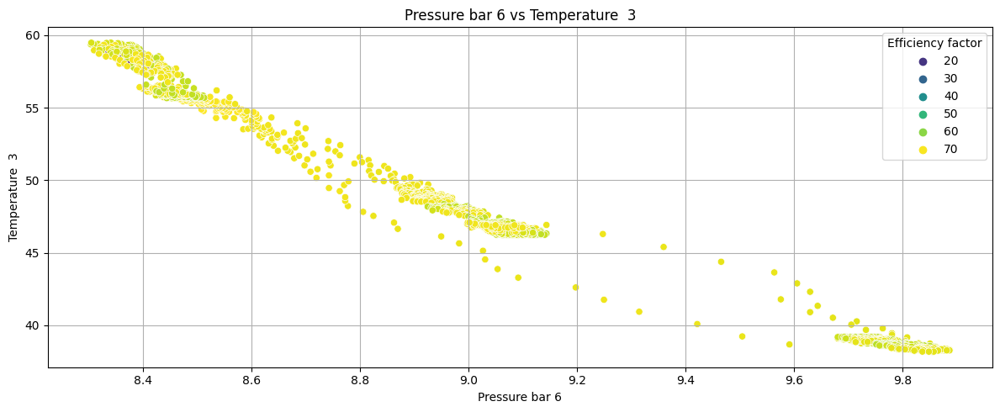

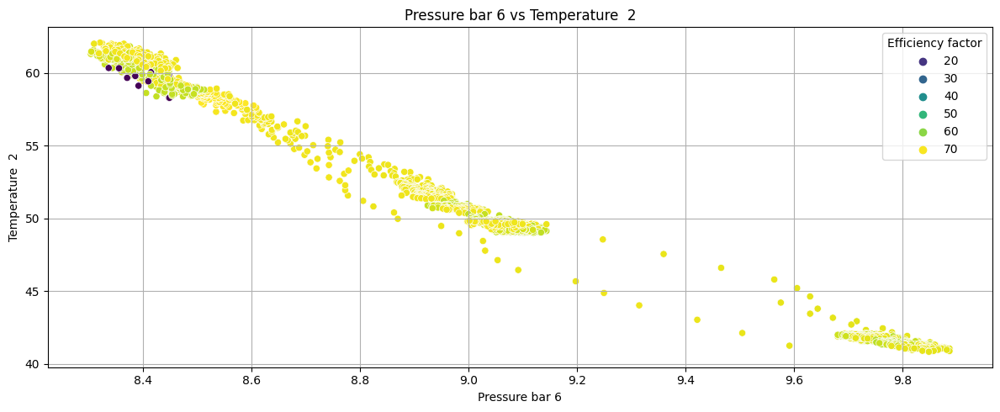

In [32]:
col = columns[10]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Pressure bar 6** has high correlations with: 

- Cooling efficiency
- Cooling power
- Motor power
- Pressure bar 3, 4, 5, 6
- Temperature  2, 3, 4
- Vibration
- Volume flow 2

None of the graphs above show an impact of these correlations on Efficiency factor of the system



Temperature 1 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


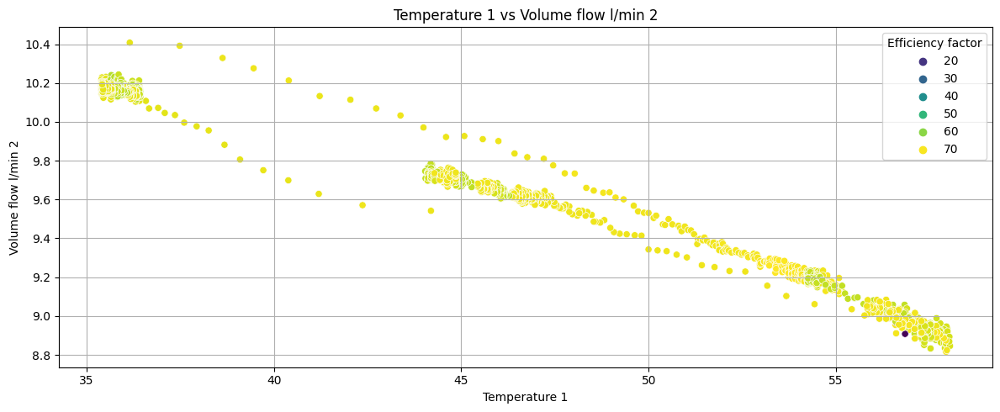

In [33]:
col = columns[11]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Temperature 1** has high correlations with: 

- Cooling efficiency
- Cooling power
- Motor power
- Pressure bar 3, 5, 6
- Temperature  1, 2, 3, 4
- Vibration
- Volume flow 2

None of the graphs above show an impact of these correlations on Efficiency factor of the system



Temperature  2 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


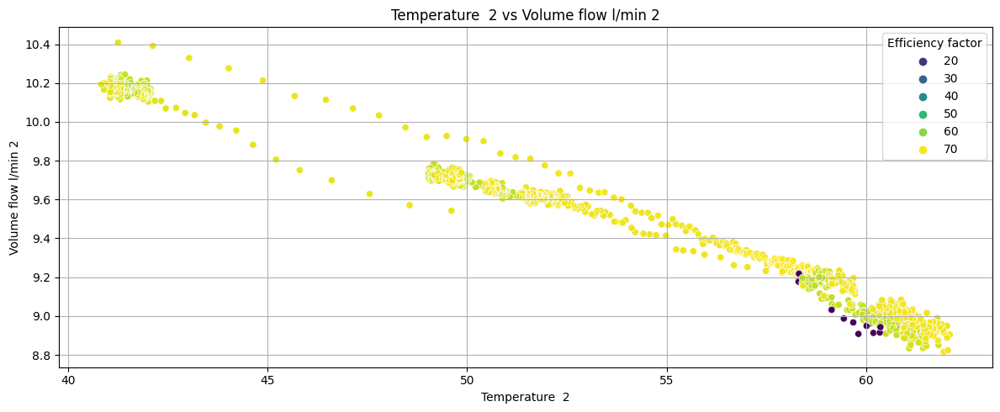

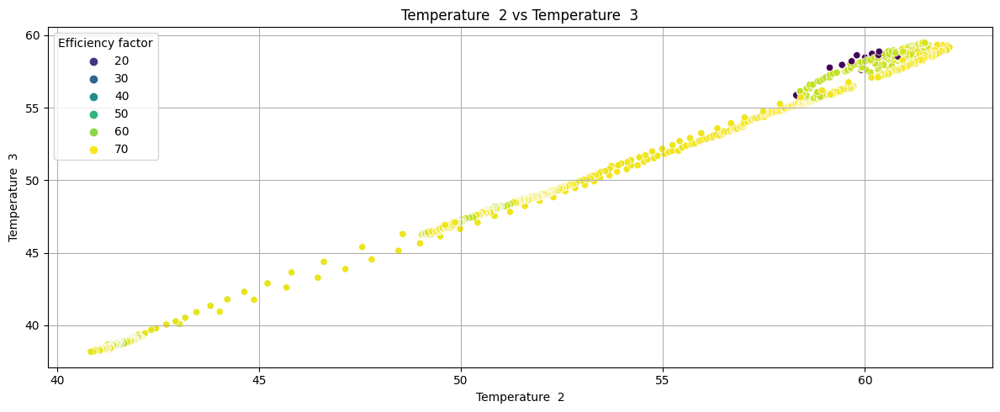

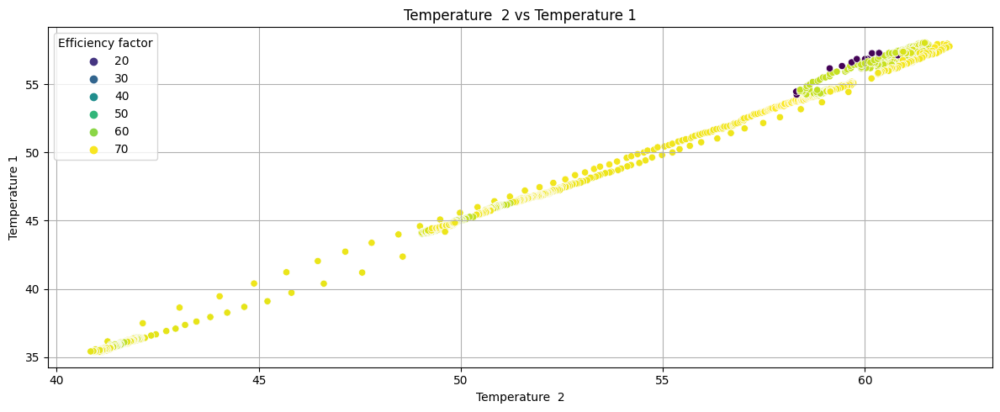

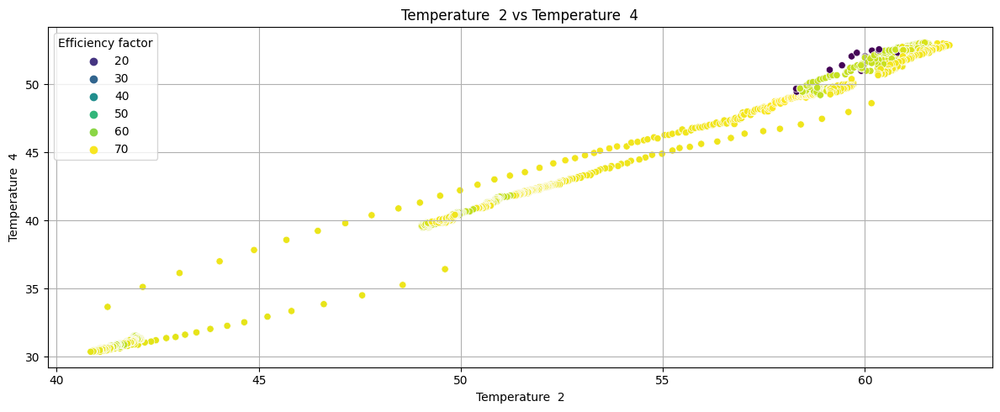

In [34]:
col = columns[12]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Temperature 2** has high correlations with: 

- Cooling efficiency
- Cooling power
- Motor power
- Pressure bar 3, 5, 6
- Temperature  1, 2, 3, 4
- Vibration
- Volume flow 2

None of the graphs above show an impact of these correlations on Efficiency factor of the system



Temperature  3 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


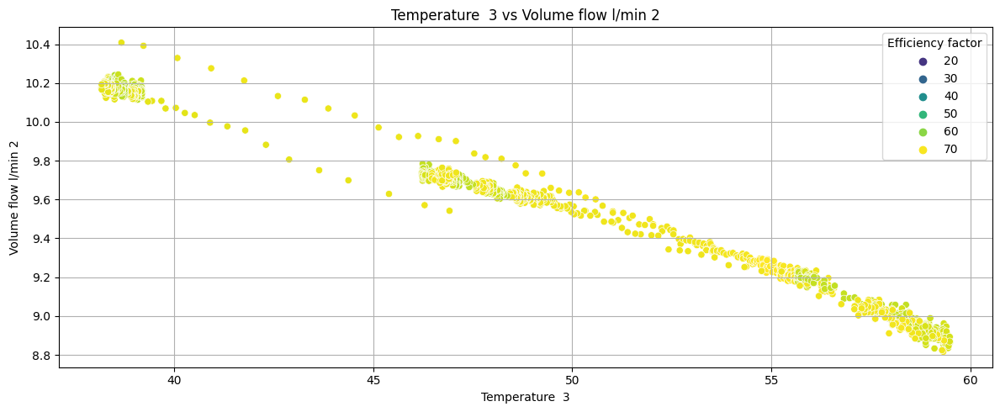

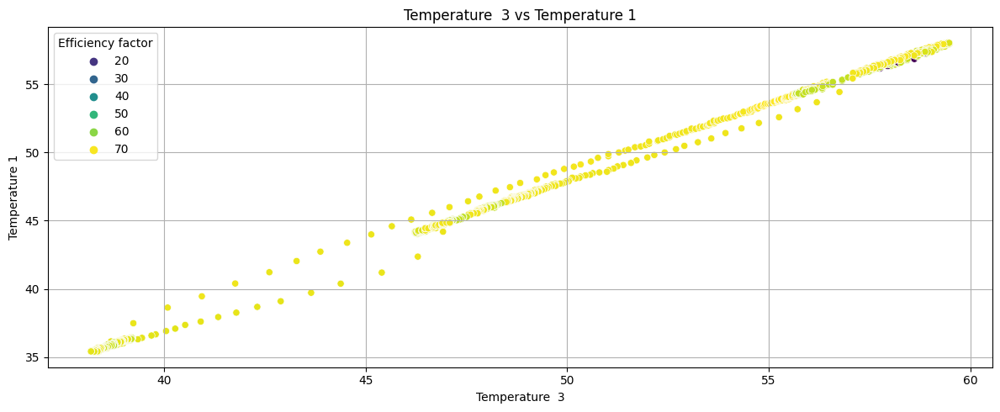

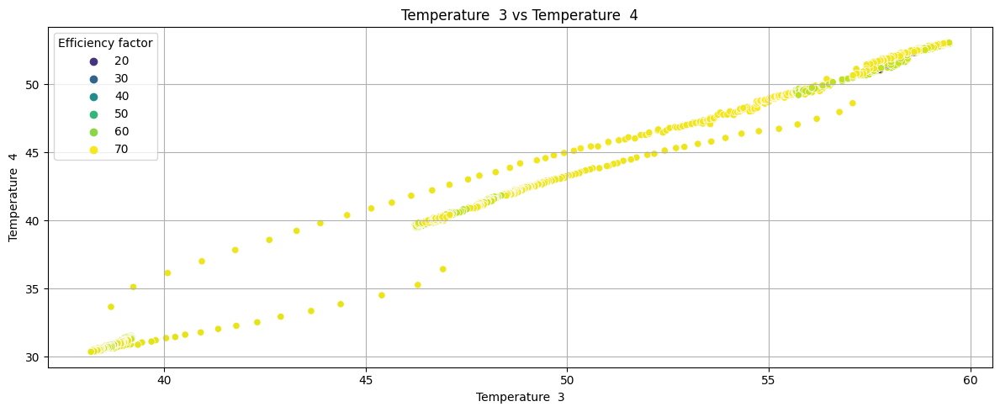

In [35]:
col = columns[13]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Temperature 3** has high correlations with: 

- Cooling efficiency
- Cooling power
- Motor power
- Pressure bar 3, 5, 6
- Temperature  1, 2, 3, 4
- Vibration
- Volume flow 2

None of the graphs above show an impact of these correlations on Efficiency factor of the system



Temperature  4 Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Motor power W', 'Pressure bar 3', 'Pressure bar 4', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


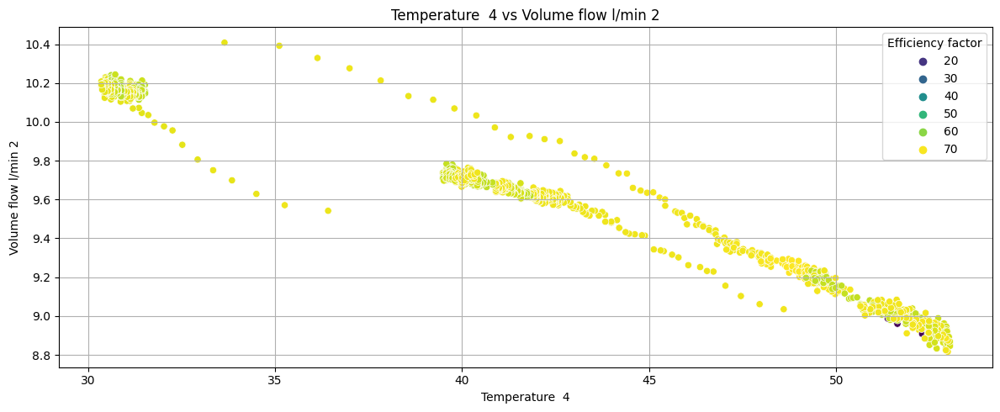

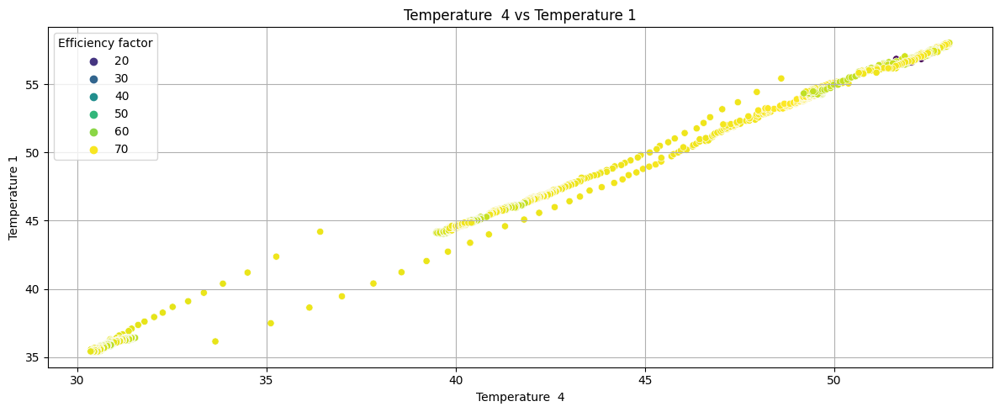

In [36]:
col = columns[14]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Temperature 4** has high correlations with: 

- Cooling efficiency
- Cooling power
- Motor power
- Pressure bar 3, 5, 6
- Temperature  1, 2, 3, 4
- Vibration
- Volume flow 2

None of the graphs above show an impact of these correlations on Efficiency factor of the system



 Vibration mm/s Correlations > +- 0.7
[' Vibration mm/s', 'Cooling efficiency', 'Cooling power', 'Pressure bar 3', 'Pressure bar 5', 'Pressure bar 6', 'Temperature  2', 'Temperature  3', 'Temperature  4', 'Temperature 1', 'Volume flow l/min 2']


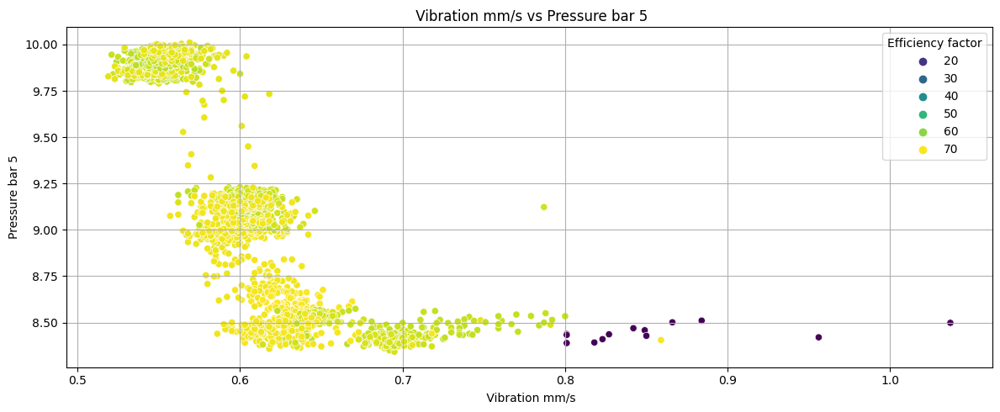

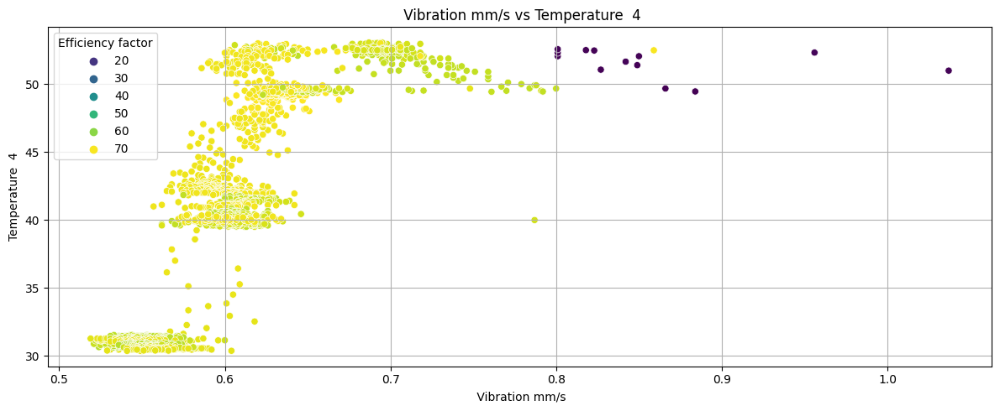

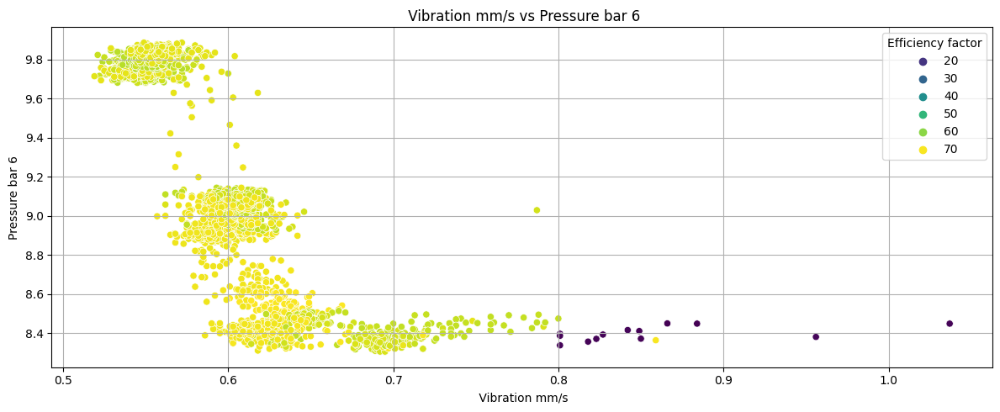

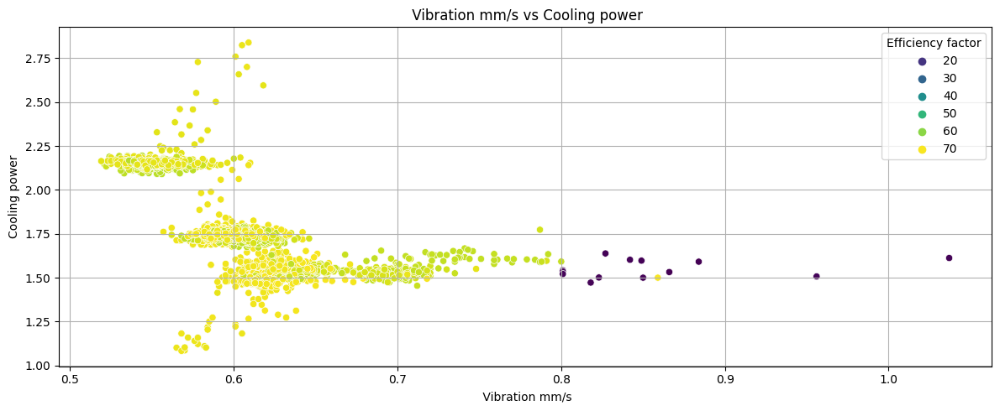

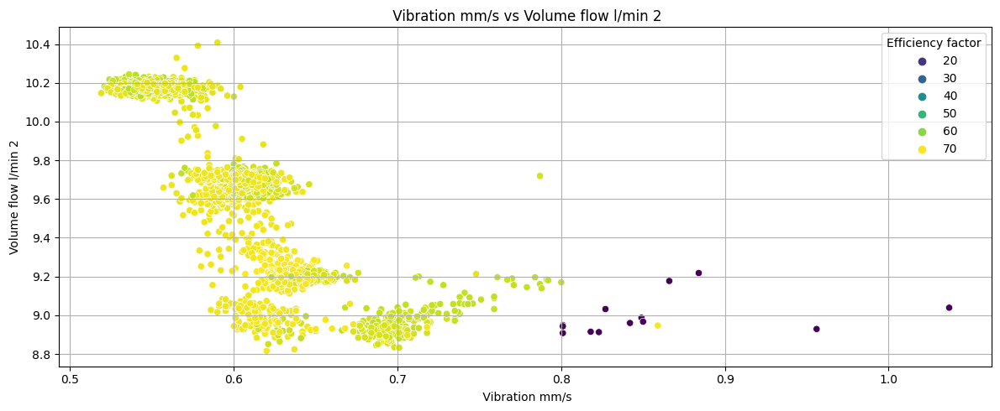

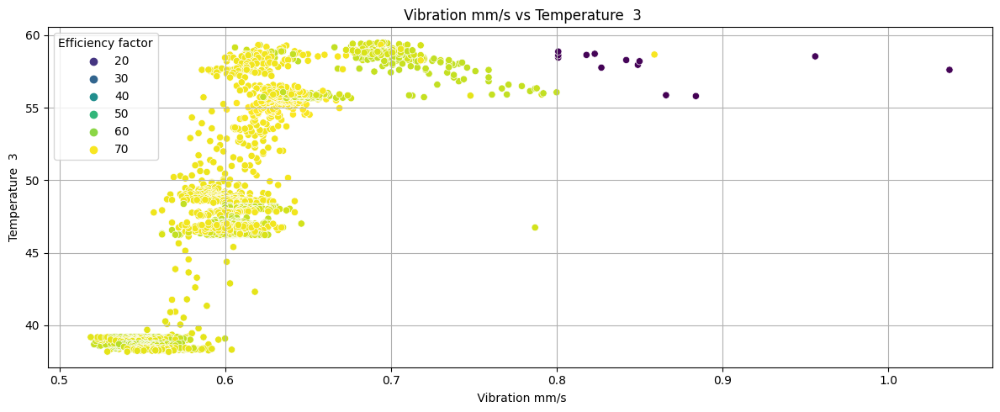

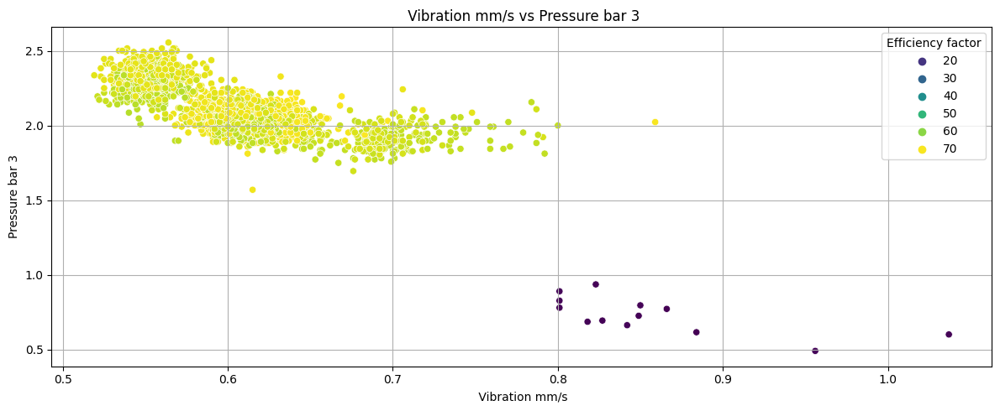

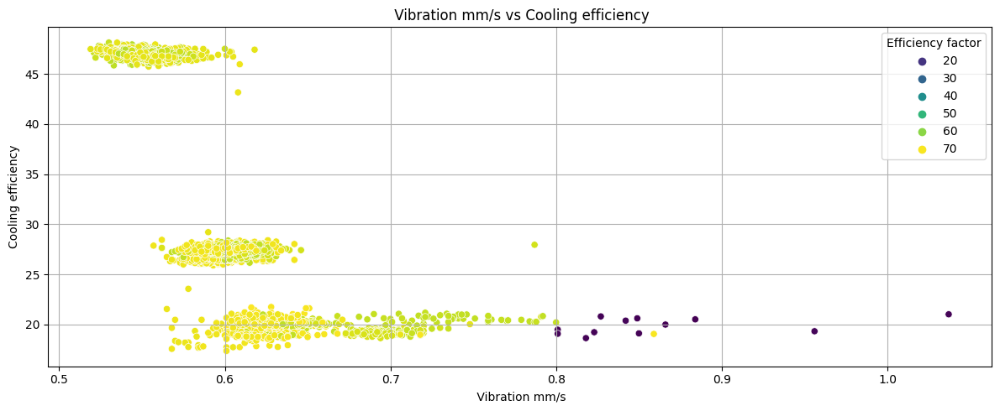

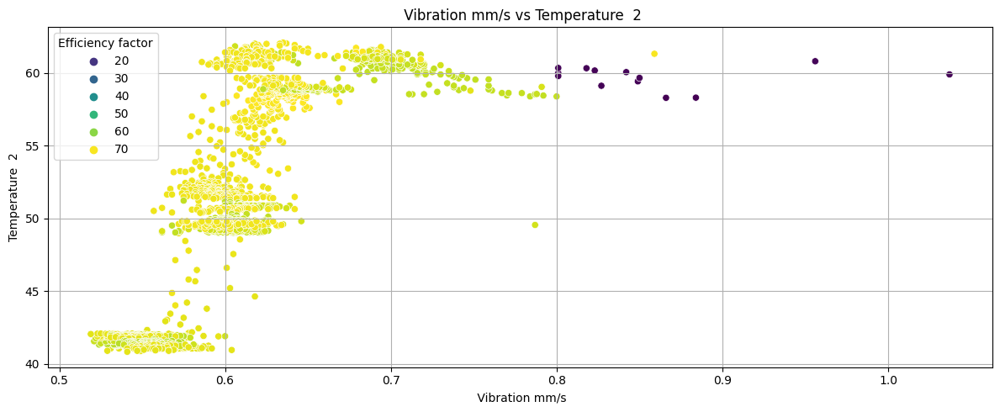

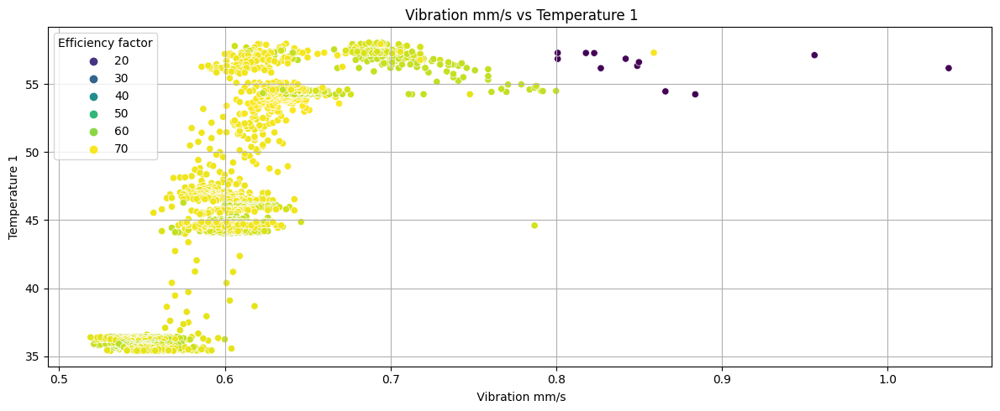

In [37]:
col = columns[15]
print('\n\n'+ col + ' Correlations > +- ' + str(abs_corr_val))
print(pairs[col])

for pair in unique:
    if pair[0] == col:
        sns.scatterplot(data=df_i, x= pair[0], y= pair[1], hue= 'Efficiency factor', palette= 'viridis')
        plt.title(pair[0] + ' vs ' + pair[1])
        plt.grid()
        plt.show()

**Vibration** has high correlations with: 

- Cooling efficiency
- Cooling power
- Pressure bar 3, 5, 6
- Temperature  1, 2, 3, 4
- Vibration
- Volume flow 2


From the graph above, we can infer that the **Efficiency factor** of the system is affected only when:

    Vibration >= 0.8 and 
        - Pressure bar 3 < 1.5

## Conclusion

After plotting how all correlations above 0.7 affect Efficiency factor of the system, we can afirm that the system is affect when the following sensors reach the cited thresholds at the same time:

    Cooling efficiency < 25 and Motor power W > 2800
                            and Pressure bar 3 < 1
    Cooling power < 1.75 and Motor power W > 2500
                         and Pressure bar 3 < 1.5
    Motor power > 2500 and Pressure bar 1 > 160
                       and Pressure bar 2 > 130
    Pressure bar 1 > 160 and Pressure bar 2 > 130
    Vibration >= 0.8 and Pressure bar 3 < 1.5

